# Collision Risk for Whales in the New York Bight

## Background

### Topic
This project focuses on the risk of collisions between whales and ships in the New York Bight, an area of ocean off the coasts of New York and New Jersey, USA. Ship strikes are a major threat to several endangered and threatened whale species that inhabit and/or migrate through this region.
### Research Questions
1. Where in the New York Bight is the risk of whale-ship collisions highest, based on the overlap between whale presence and ship traffic?
2. How does the timing and location of ship traffic in the New York Bight overlap with seasonal patterns of whale presence?
### Scope
The project covers the marine area known as the New York Bight, stretching from the New Jersey coast to Long Island. It will look at whale sightings and ship traffic patterns over 2017-2020 to capture recent trends, with a focus on migration seasons when whales are more likely to be present. The spatial scale is regional and aimed at identifying broad areas of risk rather than specific events or ship movements.

### Data
**Ship Traffic (Raster Data)** - Ship traffic was sourced from the Northeast Regional Ocean Council (NROC) Northeast Ocean Data website (https://www.northeastocandata.org/). The dataset includes detailed Automatic Identification System (AIS) information on ship movement along the U.S. Northeastern coast, including vessel type, location, date, and time. Raster layers showing monthly data of track density for 2018 was used for this study, with the assumption that ship traffic present similarly by month across the years of the study. Monthly data for the year 2018 was downloaded as part of a geodatabase file. As gdb files are proprietary to ESRI, the database was imported into ArcGIS first to extract the vessel count raster for each month, which was clipped to the region of interest using the bounding box. The rasters were then georeferenced and set to WGS84 to match the whale sightings data. 13 raster layers were used for this study (12 for each month, and one for the entire year).

File names: "Jan.tif" "Feb.tif" "Mar.tif" "Apr.tif" "May.tif" "Jun.tif" "Jul.tif" "Aug.tif" "Sep.tif" "Oct.tif" "Nov.tif" "Dec.tif" "ShipTraffic.tif"

**Shoreline (Polygon Data)** - Polygon data of U.S. states that fall within the study area, considered collectively as the shoreline, was sourced from ArcGIS Hub with the data from The Nature Conservancy (https://services.arcgis.com/F7DSX1DSNSiWmOqh/arcgis/rest/services/States/FeatureServer)

File name: "States.shp"

**Whale Sightings (Point Data)** - Whale sightings data was gathered from the New York State Department of Environmental Conservation (NYSDEC) through the Global Biodiversity Information Facility (GBIF) (https://www.gbif.org/). This dataset includes aerial whale monitoring surveys conducted across the New York Bight between March 2017 and February 2020, consisting of 36 monthly line-transect flights. The data was cleaned to include only relevant species.

File name: "WhaleSightings.csv"


### Introduction
The New York Bight provides important habitat for six whale species: the Blue whale (*Balaenoptera musculus*), Fin whale (B. physalus), Humpback whale (*Megaptera novaeangliae*), North Atlantic Right whale (*Eubalaena glacialis*), Sei whale (*Balaenoptera borea*is), and Sperm whale (Physeter macrocephalus*) (New York State Department of Environmental Conservation, 2023; Zoidis et al., 2021).

This region is particularly important for whales as they serve as supplementary feeding grounds, where they lunge feed in nearshore areas on locally schooling fish such as the Sand Lance and Atlantic Menhaden (King et al., 2021). At the same time, the New York Bight serves as the Port of New York and Port of New Jersey, cumulatively serving as the busiest port in the Eastern United States and the third in the country (Rodrigue, 2003). 

With the overlap in shipping channels and whale feeding grounds, there is an increase in risk; these whales are especially vulnerable in areas with high ship traffic (Brown et al., 2019). Whales are at huge risk of vessel strikes due to their need to surface and breathe air (Pirotta et al., 2019). These can lead to blunt force trauma and lacerations, which may be lethal or have lasting effects on the populations' ability to reproduce or function (Pirotta et al., 2023).

The high presence of ships may also cause noise pollution, therefore increasing stress and may lead to disruptions in whale echolocation and communication capability (Johnston & Painter, 2024) and also modifications in foraging behaviour (Sprogis, 2020; Blair et al., 2016; Pirotta et al., 2019). Modification to foraging behaviour in particular is of concern here, as the effects are compounded in the New York Bight due to the overlap in foraging grounds and shipping channels.


## Import Libraries

In [1]:
# In this cell, we import all libraries that we will use.
# This removes the need to include import code later on, and keeps code clean and readable throughout

import os
import numpy as np
import numpy.ma as ma
import pandas as pd
import geopandas as gpd
import rasterio
import contextily as ctx
import matplotlib.pyplot as plt 
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import matplotlib_scalebar.scalebar as sb
import seaborn as sns
import calendar
import warnings
from geopandas import clip
from rasterio.plot import show
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.io import MemoryFile
from rasterio.mask import mask
from rasterio.crs import CRS
from rasterio.features import geometry_mask
from rasterio.features import rasterize
from rasterio.transform import rowcol
from rasterio.transform import from_origin
from rasterio.transform import xy
from matplotlib import colors
from matplotlib.patches import Patch
from matplotlib_scalebar.scalebar import ScaleBar
from shapely.geometry import Point
from shapely.geometry import box
from scipy.stats import gaussian_kde
from scipy.ndimage import distance_transform_edt

## Section 1: Load, Check, and Visualise the Data

To start, we load, check, and visualise all the datasets to familiarise ourselves with the spatial data we will be working with. This sets up the groundwork for future processing and analyses.

### 1.1: Study Area & Shoreline (Polygon Data)

In [2]:
# Load the study area and check the data

studyarea = gpd.read_file('data/StudyArea.shp')
studyarea.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   id        1 non-null      int64   
 1   geometry  1 non-null      geometry
dtypes: geometry(1), int64(1)
memory usage: 148.0 bytes


In [3]:
# Load the shoreline and check the data

shoreline = gpd.read_file('data/States.shp')
shoreline.head()

,OBJECTID_1,ObjectID,STATE_NAME,STATE_FIPS,SUB_REGION,STATE_ABBR,POP2000,POP2007,POP00_SQMI,POP07_SQMI,...,AVG_SALE97,SQMI,Hectares,Acres,SQKM,SplitName,gridcode,Shape__Are,Shape__Len,geometry
0,3.0,7.0,District of Columbia,11,South Atlantic,DC,572059.0,591318.0,8412.6,8695.9,...,-99.00,68.0,None,None,176.824211,z_District of Columbia,12,1.768242e+08,66050.396607,"POLYGON ((-77.11990 38.93430, -77.11940 38.934..."
1,4.0,8.0,Delaware,10,South Atlantic,DE,783600.0,880458.0,390.4,438.7,...,280.81,2007.0,None,None,5196.934422,z_Delaware,10,5.196934e+09,798970.631662,"MULTIPOLYGON (((-75.78860 39.68469, -75.78846 ..."
2,18.0,40.0,Rhode Island,44,New England,RI,1048319.0,1085885.0,964.4,999.0,...,65.58,1087.0,None,None,2816.496092,z_Rhode Island,5,2.816496e+09,805348.790081,"MULTIPOLYGON (((-71.87974 41.31145, -71.87971 ..."
3,22.0,47.0,Vermont,50,New England,VT,608827.0,636590.0,63.3,66.2,...,81.73,9614.0,None,None,24900.529142,z_Vermont,3,2.490053e+10,914793.368996,"POLYGON ((-73.43691 44.04838, -73.43567 44.051..."
4,2.0,6.0,Connecticut,09,New England,CT,3405565.0,3556875.0,684.5,714.9,...,114.36,4975.0,None,None,12884.056490,z_Connecticut,6,1.288406e+10,999334.444386,"MULTIPOLYGON (((-73.72777 41.10069, -73.71339 ..."


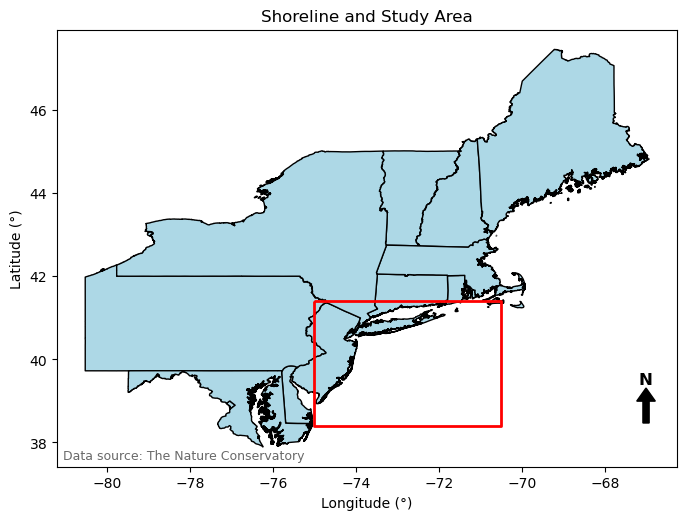

Figure 1: Shoreline (North-East Coast - USA) and study area (New York Bight) map.


In [4]:
# Visualise the data

fig, ax = plt.subplots(figsize=(8, 6))

shoreline.plot(ax=ax, edgecolor='black', facecolor='lightblue', label='Shoreline')
studyarea.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=2, label='Study Area')

# North arrow
arrow = mpatches.FancyArrow(0.95, 0.1, 0, 0.05, transform=ax.transAxes,
                            width=0.01, head_width=0.03, head_length=0.03,
                            color='black', zorder=3)
ax.add_patch(arrow)
ax.text(0.949, 0.20, 'N', transform=ax.transAxes,
        ha='center', va='center', fontsize=12, fontweight='bold', color='black')

# Add source text
ax.text(0.01, 0.01, 'Data source: The Nature Conservatory', transform=ax.transAxes,
        fontsize=9, color='dimgray', ha='left', va='bottom')

plt.title('Shoreline and Study Area')
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')

plt.show()
print('Figure 1: Shoreline (North-East Coast - USA) and study area (New York Bight) map.')

### 1.2: Whale Sightings (Point Data)

In [5]:
# Load the whale sightings and check the data

whales_df = pd.read_csv('data/WhaleSightings.csv')
whales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 329 entries, 0 to 328
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gbifID                  329 non-null    int64  
 1   occurrenceID            329 non-null    object 
 2   family                  329 non-null    object 
 3   genus                   329 non-null    object 
 4   species                 326 non-null    object 
 5   verbatimScientificName  329 non-null    object 
 6   individualCount         329 non-null    int64  
 7   decimalLatitude         329 non-null    float64
 8   decimalLongitude        329 non-null    float64
 9   coordinatePrecision     329 non-null    float64
 10  eventDate               329 non-null    object 
 11  day                     329 non-null    int64  
 12  month                   329 non-null    int64  
 13  year                    329 non-null    int64  
dtypes: float64(3), int64(5), object(6)
memory 

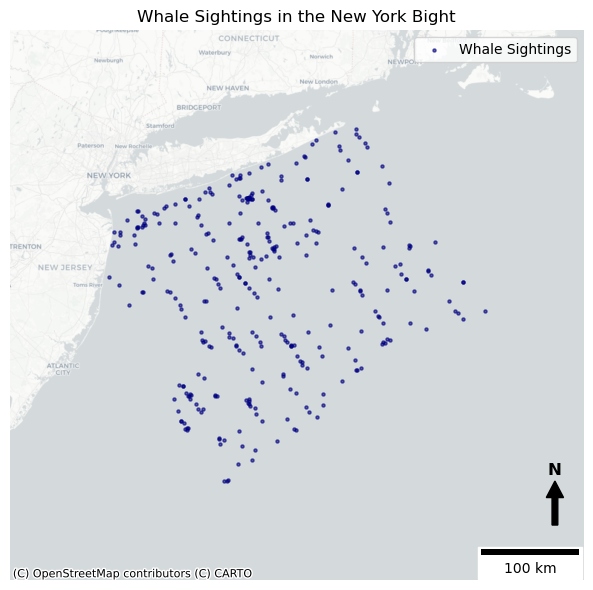

Figure 2: Map of whale sightings in the New York Bight.


In [6]:
# Visualise the data

# Create a geodataframe of the whale data
geometry = [Point(xy) for xy in zip(whales_df['decimalLongitude'], whales_df['decimalLatitude'])]
whales_gdf = gpd.GeoDataFrame(whales_df, geometry = geometry, crs = 'EPSG:4326')

# We will use a basemap from the web for context
# https://contextily.readthedocs.io/en/latest/intro_guide.html
# Basemaps are typically in EPSG 3857 (Web Mercator), so we project accordingly
# https://epsg.io/3857
whales_gdf = whales_gdf.to_crs('EPSG:3857')

# Get bounds and apply a buffer to zoom out slightly
buffer = 100_000
minx, miny, maxx, maxy = whales_gdf.total_bounds
xlim = (minx - buffer, maxx + buffer)
ylim = (miny - buffer, maxy + buffer)

# Plot
fig, ax = plt.subplots(figsize = (8, 6))
whales_gdf.plot(ax = ax, markersize = 5, alpha = 0.6, color = 'navy', label = 'Whale Sightings')

# Zoom out
ax.set_xlim(xlim)
ax.set_ylim(ylim)

# North arrow
arrow = mpatches.FancyArrow(0.95, 0.1, 0, 0.05, transform=ax.transAxes,
                            width=0.01, head_width=0.03, head_length=0.03,
                            color='black', zorder=3)
ax.add_patch(arrow)
ax.text(0.949, 0.20, 'N', transform=ax.transAxes,
        ha='center', va='center', fontsize=12, fontweight='bold', color='black')

# Scalebar
scalebar = sb.ScaleBar(dx=1, units="m", location='lower right')
ax.add_artist(scalebar)

# Add basemap
ctx.add_basemap(ax, source = ctx.providers.CartoDB.Positron)

ax.set_title('Whale Sightings in the New York Bight')
ax.legend(loc = 'upper right')
ax.axis('off')
plt.tight_layout()
plt.show()
print('Figure 2: Map of whale sightings in the New York Bight.')

### 1.3: Ship Traffic (Raster Data)

In [7]:
# Load the ship traffic and check the data

# We use the annual data for visualisation only - monthly data will be used for analysis
# The monthly rasters are clipped to the study area, wheras the annual raster shows a much larger area
ship_raster = rasterio.open('data/ShipTraffic.tif')
print(ship_raster.meta)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': 3.3999999521443642e+38, 'width': 9423, 'height': 7760, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(0.001592130360819272, 0.0, -79.001179272,
       0.0, -0.001592130360953608, 45.598988365)}


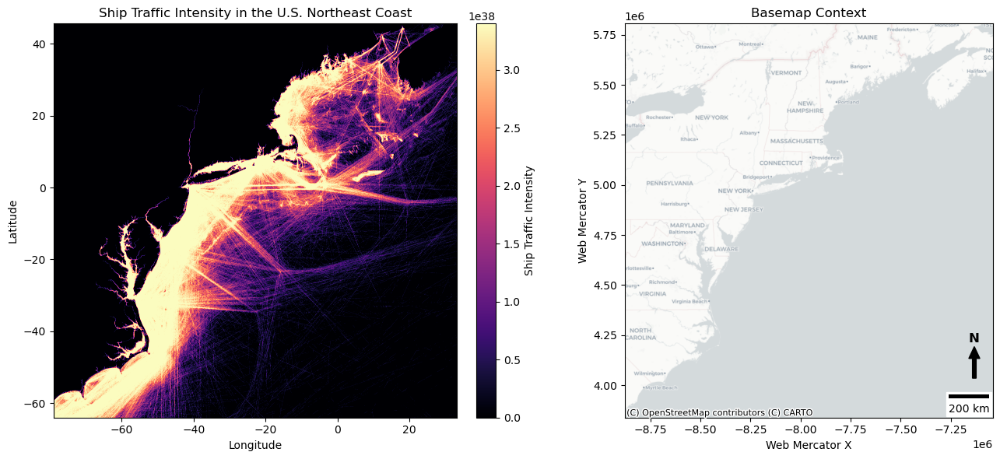

Figure 3: Raster map of ship traffic (left) & basemap for context (right).


In [8]:
# Visualise the annual data

# Read the data
raster_data = ship_raster.read(1).astype(float)

# For this visualisation, we invert the data values
# This will make high pixel values represent high traffic
max_val = np.nanmax(raster_data)
inverted_raster = max_val - raster_data

# Stretch for better contrast
vmin = np.nanpercentile(inverted_raster, 5)
vmax = np.nanpercentile(inverted_raster, 95)

# We will use a basemap from the web for context
# Create a bounding box from the raster bounds for the basemap
raster_bounds = ship_raster.bounds
bbox = box(*raster_bounds)
bbox_gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs=ship_raster.crs)
bbox_web = bbox_gdf.to_crs(epsg=3857)

# Plot
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Left: Raster map
img = axs[0].imshow(inverted_raster, cmap = 'magma', vmin = vmin, vmax = vmax,
                    extent = ship_raster.bounds, origin = 'upper')
axs[0].set_title('Ship Traffic Intensity in the U.S. Northeast Coast')
axs[0].set_xlabel('Longitude')
axs[0].set_ylabel('Latitude')
cbar = plt.colorbar(img, ax = axs[0], orientation = 'vertical', fraction = 0.046, pad = 0.04)
cbar.set_label('Ship Traffic Intensity')

# Right: Basemap
bbox_web.plot(ax = axs[1], facecolor = 'none', alpha = 0)
ctx.add_basemap(axs[1], crs = 'EPSG:3857', source = ctx.providers.CartoDB.Positron)
axs[1].set_title('Basemap Context')
axs[1].set_xlabel('Web Mercator X')
axs[1].set_ylabel('Web Mercator Y')
# North arrow
arrow = mpatches.FancyArrow(0.95, 0.1, 0, 0.05, transform=axs[1].transAxes,
                            width=0.01, head_width=0.03, head_length=0.03,
                            color='black', zorder=3)
axs[1].add_patch(arrow)
axs[1].text(0.949, 0.20, 'N', transform=axs[1].transAxes,
        ha='center', va='center', fontsize=12, fontweight='bold', color='black')
# Scalebar
scalebar = sb.ScaleBar(dx=1, units="m", location='lower right')
axs[1].add_artist(scalebar)

plt.tight_layout()
plt.show()
print('Figure 3: Raster map of ship traffic (left) & basemap for context (right).')

In [9]:
# Load and check the monthly raster files

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Open all monthly rasters
# Create a dictionary to hold each month's raster data
# This will allow us to access each month's raster easily using "monthly_rasters['month']"
monthly_rasters = {}
for month in months:
    filename = f"data/{month}.tif"
    with rasterio.open(filename) as src:
        data = src.read(1)
        monthly_rasters[month] = data.copy()

monthly_rasters['Jan']

array([[3.4e+38, 3.4e+38, 3.4e+38, ..., 3.4e+38, 3.4e+38, 3.4e+38],
       [3.4e+38, 3.4e+38, 3.4e+38, ..., 3.4e+38, 3.4e+38, 3.4e+38],
       [3.4e+38, 3.4e+38, 3.4e+38, ..., 3.4e+38, 3.4e+38, 3.4e+38],
       ...,
       [2.0e+00, 3.4e+38, 3.4e+38, ..., 3.4e+38, 3.4e+38, 3.4e+38],
       [2.0e+00, 3.4e+38, 3.4e+38, ..., 3.4e+38, 3.4e+38, 3.4e+38],
       [2.0e+00, 3.4e+38, 3.4e+38, ..., 3.4e+38, 3.4e+38, 3.4e+38]],
      dtype=float32)

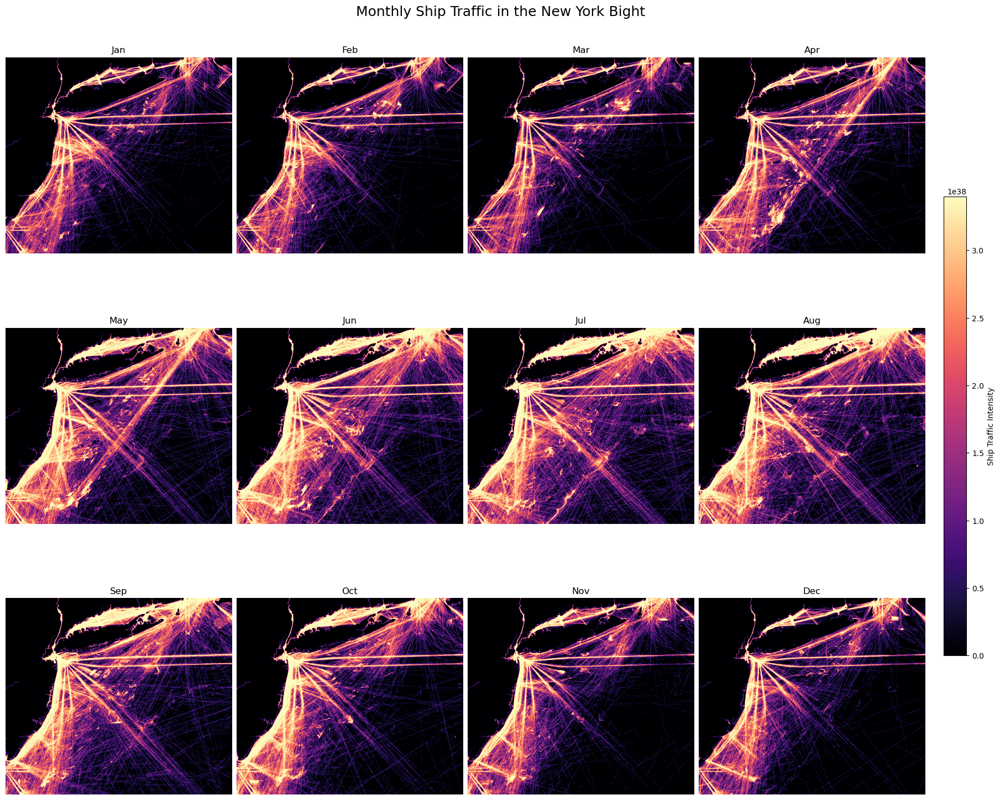

Figure 4: Maps of ship traffic in the study area per month.


In [10]:
# Visualise the monthly data

# Invert values for all rasters
inverted_rasters = []
for month in months:
    data = monthly_rasters[month]
    max_val = np.nanmax(data)
    inverted = max_val - data
    inverted_rasters.append(inverted)

# Stretch contrast for all rasters
all_values = np.concatenate([r[~np.isnan(r)] for r in inverted_rasters])
vmin = np.nanpercentile(all_values, 5)
vmax = np.nanpercentile(all_values, 95)

# Plot
fig, axs = plt.subplots(3, 4, figsize=(18, 15), constrained_layout=True)
axs = axs.flatten()

for i, month in enumerate(months):
    im = axs[i].imshow(inverted_rasters[i], cmap='magma', vmin=vmin, vmax=vmax)
    axs[i].set_title(month)
    axs[i].axis('off')

# Shared colorbar
fig.colorbar(im, ax=axs, orientation='vertical', fraction=0.025, pad=0.02, label='Ship Traffic Intensity')

plt.suptitle("Monthly Ship Traffic in the New York Bight", fontsize=18)
plt.show()
print('Figure 4: Maps of ship traffic in the study area per month.')

## Section 2: Project and Prepare the Data

We project the datasets so that all layers share a common coordinate reference system (CRS). This will ensure that the data layers align accurately when we overlay them for spatial analysis.

The CRS we are using is EPSG:32618, a Universal Transverse Mercator (UTM) projection for U.S. Zone 18N. It is suitable for our study as it provides accurate distance measurements for the area.

https://epsg.io/32618

In [11]:
# Project the polygon data and confirm

# We force set the original crs to EPSG 4326
shoreline = shoreline.set_crs(epsg=4326, allow_override=True)
studyarea = studyarea.set_crs(epsg=4326, allow_override=True)

# Project
shoreline = shoreline.to_crs(epsg=32618)
studyarea = studyarea.to_crs(epsg=32618)

print(shoreline.crs)
print(studyarea.crs)

EPSG:32618
EPSG:32618


In [12]:
# Project the sightings data and confirm

whales_gdf = whales_gdf.to_crs('EPSG:32618')
print(whales_gdf.crs)

EPSG:32618


In [13]:
# Project the raster files and save

# Destination CRS
dest_crs = rasterio.crs.CRS.from_epsg(32618)

# Create output directory
output_path = './output'
if not os.path.exists(output_path):
    os.mkdir(output_path)

# Loop through all months
for month in months:
    in_file = f'data/{month}.tif'
    out_file = f'{output_path}/{month}_proj.tif'

    with rasterio.open(in_file) as src:
        # Compute transform and output dimensions
        out_transform, out_width, out_height = calculate_default_transform(
            src.crs, dest_crs, src.width, src.height, *src.bounds#, resolution=out_res
        )

        # Update profile
        out_profile = src.profile.copy()
        out_profile.update({
            'crs': dest_crs,
            'transform': out_transform,
            'width': out_width,
            'height': out_height,
            'compress': 'DEFLATE'
        })

        # Reproject and save
        with rasterio.open(out_file, 'w', **out_profile) as dst:
            reproject(
                source=rasterio.band(src, 1),
                destination=rasterio.band(dst, 1),
                src_crs=src.crs,
                dst_crs=dest_crs,
                src_transform=src.transform,
                dst_transform=out_transform,
                resampling=Resampling.bilinear
            )

In [14]:
# Confirm the projection
with rasterio.open('./output/Jan_proj.tif') as jan_proj:
    print(jan_proj.crs)

EPSG:32618


In [15]:
# Clean and prepare the raster data

# Create a dictionary to hold each month's projected raster data
# Open all projected monthly rasters, remove nodata values, and add to the dictionary
# This will allow us to access each month's projected raster easily using "monthly_rasters_proj['month']"

monthly_rasters_proj = {}

for month in months:
    path = f'./output/{month}_proj.tif'
    with rasterio.open(path) as src:
        data = src.read(1).astype('float32')
        nodata_val = src.nodata
        if nodata_val is not None:
            data[data == nodata_val] = np.nan

        monthly_rasters_proj[month] = data

## Section 3: Exploratory Spatial Data Analysis (ESDA)

### 3.1: ESDA - Whale Sightings

ESDA of whale sightings focuses on identifying general spatial and temporal trends, and comparing those trends between species. The aim is to explore patterns relevant to understanding when and which species are most frequently present in the study area over the study period.

In [16]:
# Check the data

whales_gdf.head()

,gbifID,occurrenceID,family,genus,species,verbatimScientificName,individualCount,decimalLatitude,decimalLongitude,coordinatePrecision,eventDate,day,month,year,geometry
0,3938541584,2209_1800,Physeteridae,Physeter,Physeter macrocephalus,Physeter macrocephalus,1,39.569000,-72.409000,0.000001,2018-01-10T15:06:22,10,1,2018,POINT (722565.650 4383129.080)
1,3938541585,2209_1802,Physeteridae,Physeter,Physeter macrocephalus,Physeter macrocephalus,2,38.853358,-72.475153,0.000001,2018-06-14T11:13:32,14,6,2018,POINT (719096.752 4303533.266)
2,3938541586,2209_1801,Physeteridae,Physeter,Physeter macrocephalus,Physeter macrocephalus,5,39.396245,-72.248092,0.000001,2018-04-11T14:23:54,11,4,2018,POINT (736975.632 4364363.285)
3,3938541592,2209_1811,Physeteridae,Physeter,Physeter macrocephalus,Physeter macrocephalus,2,39.088958,-72.673484,0.000001,2019-04-10T10:57:20,10,4,2019,POINT (701216.047 4329225.052)
4,3938541593,2209_1810,Physeteridae,Physeter,Physeter macrocephalus,Physeter macrocephalus,4,39.226210,-72.355422,0.000001,2019-03-13T10:49:35,13,3,2019,POINT (728284.090 4345212.806)


In [17]:
# Check the study area

# Get bounds
minx, miny, maxx, maxy = whales_gdf.total_bounds

# Get width and height in meters
width = maxx - minx
height = maxy - miny

# Area in m²
area_m2 = width * height

# Convert to km²
area_km2 = area_m2 / 1e6

print(f'Approximate study area: {area_km2:.2f} km²')

Approximate study area: 80933.13 km²


In [18]:
# Check the study period

# Currently, we have day, month, and year in separate columns
# We can combine them into a single date column using datetime and add it to the data
# https://pandas.pydata.org/docs/reference/api/pandas.to_datetime.html
whales_df['date'] = pd.to_datetime(whales_df[['year', 'month', 'day']], errors = 'coerce')
whales_gdf['date'] = pd.to_datetime(whales_gdf[['year', 'month', 'day']], errors = 'coerce')

# Drop missing or invalid dates
valid_dates_w = whales_df['date'].dropna() # w = whales

# Find the earliest and latest date
earliest_date_w = valid_dates_w.min()
latest_date_w = valid_dates_w.max()

# Format with slashes for better readability
# https://www.programiz.com/python-programming/datetime/strftime
start_str_w = earliest_date_w.strftime('%d/%m/%Y')
end_str_w = latest_date_w.strftime('%d/%m/%Y')

print(f'Study period: {start_str_w} - {end_str_w}')

Study period: 20/03/2017 - 15/02/2020


In [19]:
# Create a table of summary statistics for the sightings

# Number of sighting events
total_sightings = len(whales_df)

# Number of individuals sighted
total_individuals = whales_df['individualCount'].sum()

# Sighting events per year
sightings_per_year = whales_df.groupby('year').size()

# Number of individuals sighted per year
individuals_per_year = whales_df.groupby('year')['individualCount'].sum()

# Combine into a single DataFrame
sightings_summary = pd.DataFrame({
    'Sighting Events': sightings_per_year,
    'Individuals': individuals_per_year
})

# Add a total row and display the table
# https://numpy.org/doc/2.2/reference/generated/numpy.ndarray.T.html
# https://pandas.pydata.org/docs/reference/api/pandas.concat.html
total_row = pd.DataFrame(sightings_summary.sum()).T
total_row.index = ['Total']
sightings_summary = pd.concat([sightings_summary, total_row])

print('Table 1: Number of whale sighting events and individuals sighted per year.')
sightings_summary

Table 1: Number of whale sighting events and individuals sighted per year.


,Sighting Events,Individuals
2017,56,77
2018,166,366
2019,96,180
2020,11,19
Total,329,642


A sighting event refers to an instance where the presence of at least one whale was observed.
Multiple whales (of the same species) may be observed at once during a single sighting event.

Both sighting events and individuals are highest in 2018 (166 events, 366 individuals), suggesting higher whale presence, stronger monitoring effort, or both, during this year.

In [20]:
# Check the whale species present in the data

print(whales_df['species'].unique())

['Physeter macrocephalus' 'Balaenoptera acutorostrata'
 'Megaptera novaeangliae' 'Eubalaena glacialis' 'Balaenoptera musculus'
 nan 'Balaenoptera physalus' 'Balaenoptera borealis']


In [21]:
# Replace scientific names with common names

# The data only includes the scientific names of the species; it's easier to use the common names
# We create a dictionary to do that
# Minke whales (Balaenoptera acutorostrata) are not part of the study, so we can ignore them
species_map = {
    'Balaenoptera musculus': 'Blue',
    'Balaenoptera physalus': 'Fin',
    'Megaptera novaeangliae': 'Humpback',
    'Eubalaena glacialis': 'NA Right', # North Atlantic Right Whale
    'Balaenoptera borealis': 'Sei',
    'Physeter macrocephalus': 'Sperm'
    #'Balaenoptera acutorostrata': 'Minke'
}

# We add a 'common name' column to the data
# To do this, we use the map() function, which works in this case as such:
# For each item in the species column: if that item is a key in species_map, replace it with the corresponding value.
# https://www.geeksforgeeks.org/python-map-function/
whales_df['common_name'] = whales_df['species'].map(species_map)
whales_gdf['common_name'] = whales_gdf['species'].map(species_map)

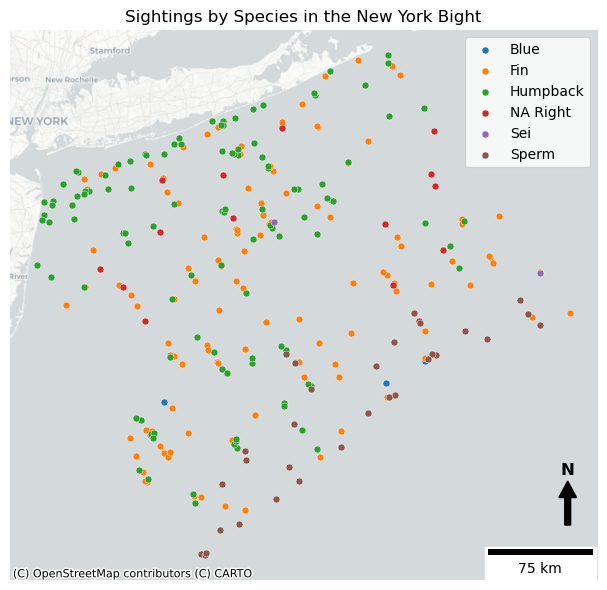

Figure 5: Map of whale sightings by species in the study area.


In [22]:
# Visualise the data

# Project to Web Mercator for basemap alignment
whales_gdf = whales_gdf.to_crs('EPSG:3857')

# Filter
known_whales = whales_gdf[whales_gdf['common_name'].notna()]

# Plot
fig, ax = plt.subplots(figsize=(8, 6))

# Split points by species
for name, group in known_whales.groupby('common_name'):
    group.plot(ax = ax, markersize = 25, edgecolor = 'white', linewidth = 0.3, label = name)

# North arrow
arrow = mpatches.FancyArrow(0.95, 0.1, 0, 0.05, transform=ax.transAxes,
                            width=0.01, head_width=0.03, head_length=0.03,
                            color='black', zorder=3)
ax.add_patch(arrow)
ax.text(0.949, 0.20, 'N', transform=ax.transAxes,
        ha='center', va='center', fontsize=12, fontweight='bold', color='black')

# Scalebar
scalebar = sb.ScaleBar(dx=1, units="m", location='lower right')
ax.add_artist(scalebar)

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

ax.set_title("Sightings by Species in the New York Bight")
ax.legend(loc='upper right')
ax.axis('off')
plt.tight_layout()
plt.show()
print('Figure 5: Map of whale sightings by species in the study area.')

* Humpback whales are common and tend to occur closer to shore.
* Sperm whales are mostly found further offshore.
* Blue whale and Sei whale sightings are very limited, so it’s difficult to draw clear conclusions about their spatial patterns. 
* Sightings of the critically endangered North Atlantic right whale are more scattered, though they also tend to stay in relatively shallow waters rather than deeper offshore zones. 

These differences between species are important, as they help show which whales may be most at risk due to where they occur relative to major shipping routes.

In [23]:
# Create a summary table of the species sightings

# Total sighting events by species
event_count = whales_df.groupby('common_name').size().sort_values(ascending = False)

# Total number of individual whales sighted per species
whale_count = whales_df.groupby('common_name')['individualCount'].sum().sort_values(ascending = False)

# Average sightings per sighting event
avg_count = (whale_count / event_count).sort_values(ascending = False)

# Highest no. of individuals in a single sighting event per species
max_individuals = whales_df.groupby('common_name')['individualCount'].max().sort_values(ascending = False)

species_sightings_summary = pd.DataFrame({
    'Sighting Events': whales_df.groupby('common_name').size(),
    'Individuals Sighted': whales_df.groupby('common_name')['individualCount'].sum(),
    'Average Individual per Sighting': round(avg_count, 2),
    'Highest Number of Individuals in Single Event': max_individuals
}).sort_values(by = 'Sighting Events', ascending = False)
species_sightings_summary.index.name = 'Common Name'

print('Table 2: Whale sighting statistics per species.')
species_sightings_summary

Table 2: Whale sighting statistics per species.


,Sighting Events,Individuals Sighted,Average Individual per Sighting,Highest Number of Individuals in Single Event
Common Name,,,,
Fin,124,207,1.67,16
Humpback,111,279,2.51,52
Sperm,32,72,2.25,7
NA Right,15,24,1.60,2
Blue,3,5,1.67,3
Sei,2,7,3.50,6


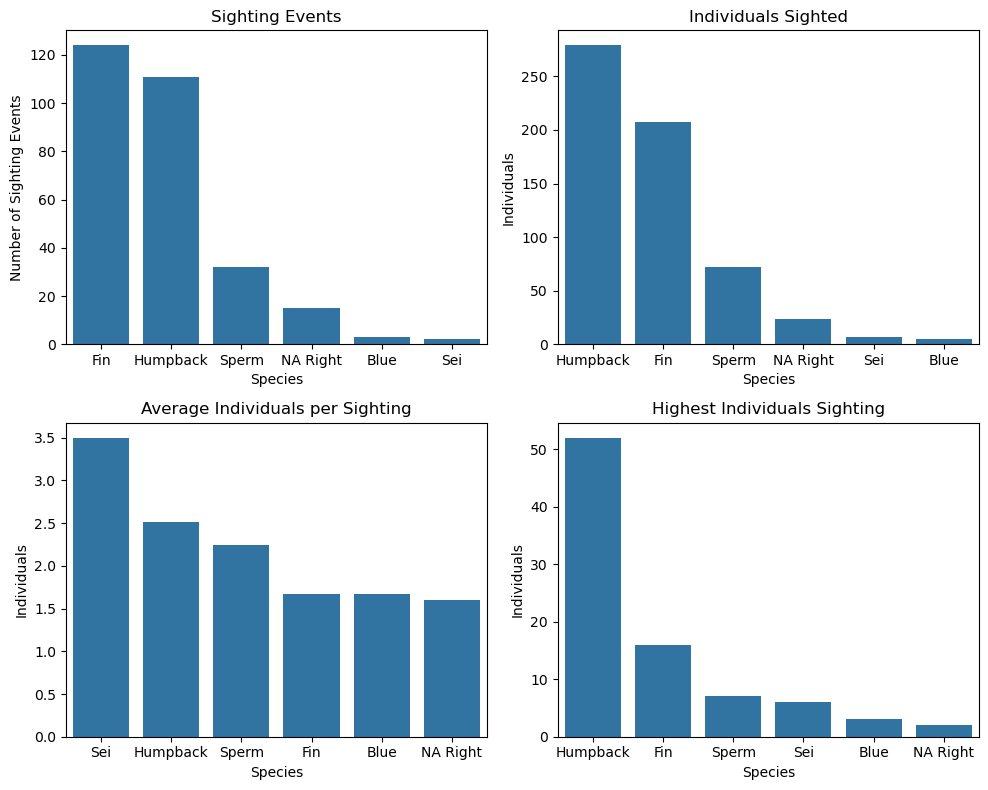

Figure 6: Bar graph of whale sighting statistics by species.


In [24]:
# Present the summary table as bar graphs

fig, axes = plt.subplots(2, 2, figsize = (10, 8))
axes = axes.flatten()

sns.barplot(x = event_count.index, y = event_count.values, ax = axes[0])
axes[0].set_title('Sighting Events')
axes[0].set_xlabel('Species')
axes[0].set_ylabel('Number of Sighting Events')

sns.barplot(x = whale_count.index, y = whale_count.values, ax = axes[1])
axes[1].set_title('Individuals Sighted')
axes[1].set_xlabel('Species')
axes[1].set_ylabel('Individuals')

sns.barplot(x = avg_count.index, y = avg_count.values, ax = axes[2])
axes[2].set_title('Average Individuals per Sighting')
axes[2].set_xlabel('Species')
axes[2].set_ylabel('Individuals')

sns.barplot(x = max_individuals.index, y = max_individuals.values, ax = axes[3])
axes[3].set_title('Highest Individuals Sighting')
axes[3].set_xlabel('Species')
axes[3].set_ylabel('Individuals')

plt.tight_layout()
plt.show()
print('Figure 6: Bar graph of whale sighting statistics by species.')

* Fin and Humpback whales are very common, accounting for the majority of events (124; Fin) and individuals (279; Humpback).
* Sei and Blue whales are extremely rare, with the lowest amount of events (2; Sei) and individuals (5; Blue), suggesting that they are less common in the region. Sei whales were sighted in large groups (3.5 average individuals), but a sample size of 2 sighting events makes it difficult to draw any conclusions.
* North Atlantic right whales are rare but critically endangered. Their presence is important regardless of numbers.
* Sperm whales have fewer events but relatively high individuals per sighting (2.25).

In [25]:
# Check sightings information by month

# Group by species and month
monthly_events = whales_df.groupby(['common_name', 'month']).size().reset_index(name = 'sighting_events')

# Group by species and month, summing individualCount
monthly_species = whales_df.groupby(['common_name', 'month'])['individualCount'].sum().reset_index()

# Convert numeric month column to abbreviated names
# https://stackoverflow.com/questions/3418050/how-to-map-month-name-to-month-number-and-vice-versa
month_names = {i: calendar.month_abbr[i] for i in range(1, 13)}

# Pivot data into table
# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.pivot.html
sightings_pivot = monthly_events.pivot(index = 'common_name', columns = 'month', values = 'sighting_events').fillna(0).astype(int)
sightings_pivot.rename(columns = month_names, inplace = True)
sightings_pivot.columns.name = None
sightings_pivot.index.name = 'Common Name'
print('Table 3: Number of whale sighting events per species per month.')
sightings_pivot

Table 3: Number of whale sighting events per species per month.


,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
Common Name,,,,,,,,,,,,
Blue,1,1,0,0,0,0,0,0,1,0,0,0
Fin,2,7,9,3,11,20,29,18,5,3,8,9
Humpback,6,4,5,7,9,19,12,16,8,12,8,5
NA Right,2,1,3,4,2,0,0,0,0,0,1,2
Sei,0,0,0,2,0,0,0,0,0,0,0,0
Sperm,2,1,2,2,0,6,6,6,3,2,0,2


In [26]:
individuals_pivot = monthly_species.pivot(index = 'common_name', columns = 'month', values = 'individualCount').fillna(0).astype(int)
individuals_pivot.rename(columns = month_names, inplace = True)
individuals_pivot.columns.name = None
individuals_pivot.index.name = 'Common Name'
print('Table 4: Number of individuals sighted per species per month.')
individuals_pivot

Table 4: Number of individuals sighted per species per month.


,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
Common Name,,,,,,,,,,,,
Blue,3,1,0,0,0,0,0,0,1,0,0,0
Fin,2,12,12,5,22,55,37,26,5,4,11,16
Humpback,19,12,6,7,21,107,18,26,28,17,10,8
NA Right,4,1,5,6,3,0,0,0,0,0,2,3
Sei,0,0,0,7,0,0,0,0,0,0,0,0
Sperm,2,2,5,7,0,7,15,22,8,2,0,2


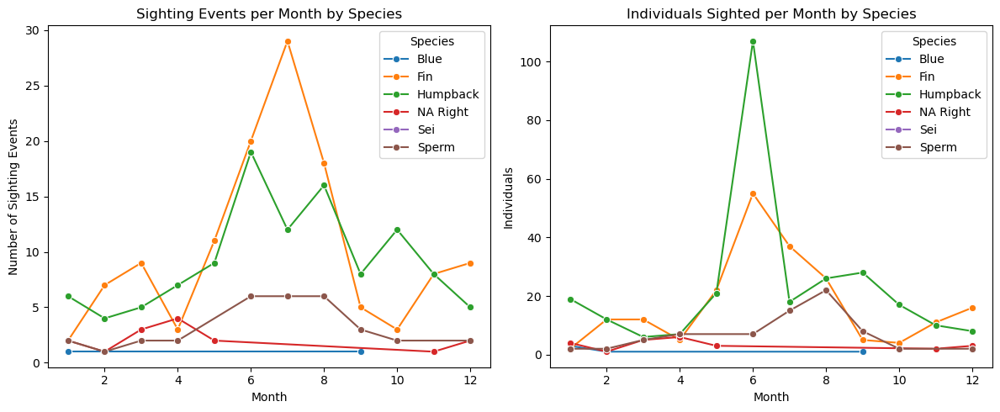

Figure 7: Line graphs of whale sighting statistics by species.


In [27]:
# Display monthly data statistics into line graphs

fig, axes = plt.subplots(1, 2, figsize = (12, 5))

sns.lineplot(data = monthly_events, x = 'month', y = 'sighting_events', hue = 'common_name', marker = 'o', ax = axes[0])
axes[0].set_title('Sighting Events per Month by Species')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Number of Sighting Events')
axes[0].legend(title = 'Species')

sns.lineplot(data = monthly_species, x = 'month', y = 'individualCount', hue = 'common_name', marker = 'o', ax = axes[1])
axes[1].set_title('Individuals Sighted per Month by Species')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Individuals')
axes[1].legend(title = 'Species')

plt.tight_layout()
plt.show()
print('Figure 7: Line graphs of whale sighting statistics by species.')

* Whale activity was highest between June and August. Fin and Humpback whales were the most commonly observed species during this period, likely reflecting seasonal migration patterns.
* Humpbacks appeared in larger groups, especially in June, suggesting they may be feeding closer to shore during that time.
* Although North Atlantic Right whales were seen less often, their sightings mostly occurred from March to May. This is an important timeframe given their endangered status.
* Sei whales were only sighted in April. As such, they don't appear in the graphs.

In [28]:
# Return to correct projection
whales_gdf = whales_gdf.to_crs('EPSG:32618')

### 3.2: ESDA - Ship Traffic

ESDA of ship traffic is used to explore how ship traffic changes over time. We explore average traffic intensity and variation between months. This helps make sense of patterns in ship movement across the study area and highlights months or areas with particularly high or uneven traffic.

In [29]:
# Create a table of summary statistics for the ship traffic

ship_summary = {}

for month in months:
    data = monthly_rasters_proj[month]
    valid_data = data[~np.isnan(data)]
    
    ship_stats = {
        'Mean': np.mean(valid_data),
        'Median': np.median(valid_data),
        'Std Dev': np.std(valid_data),
        'Min': np.min(valid_data),
        'Max': np.max(valid_data),
        '5th Percentile': np.percentile(valid_data, 5),
        '95th Percentile': np.percentile(valid_data, 95),
        'Pixel Count': valid_data.size
    }
    
    ship_summary[month] = ship_stats

ship_summary_df = pd.DataFrame(ship_summary).T
ship_summary_df = ship_summary_df.round(2)
print('Table 5: Ship traffic statistics per month.')
ship_summary_df

Table 5: Ship traffic statistics per month.


,Mean,Median,Std Dev,Min,Max,5th Percentile,95th Percentile,Pixel Count
Jan,4.89,1.38,46.41,1.0,5883.40,1.0,8.32,3671440.0
Feb,4.86,1.39,45.65,1.0,6142.10,1.0,8.24,3768586.0
Mar,4.83,1.31,46.35,1.0,5823.48,1.0,7.67,3420385.0
Apr,4.62,1.49,45.60,1.0,6093.67,1.0,7.68,4739974.0
May,5.05,1.74,47.57,1.0,6644.28,1.0,10.07,6082026.0
Jun,5.21,1.78,47.50,1.0,6548.08,1.0,11.04,6701586.0
Jul,5.28,1.67,47.04,1.0,6471.21,1.0,11.62,6806372.0
Aug,5.76,1.80,50.65,1.0,7325.37,1.0,12.75,6534212.0
Sep,5.33,1.67,50.18,1.0,7439.07,1.0,10.66,5850464.0
Oct,5.70,1.77,54.72,1.0,7621.34,1.0,10.87,5048797.0


The data shows a highly positively-skewed distribution, with mean values around 5 but medians around just 1.5. This indicates that most areas have low traffic while a few hotspots experience extremely high activity, probably ports and dedicated shipping routes. This is confirmed by the large standard deviations (around 48), and maximum values (around 6,000 - 7,000) far above the 95th percentiles (around 10). Both the minimums and 5th percentiles are 1.0, suggesting a lower threshold or background filtering in the data.

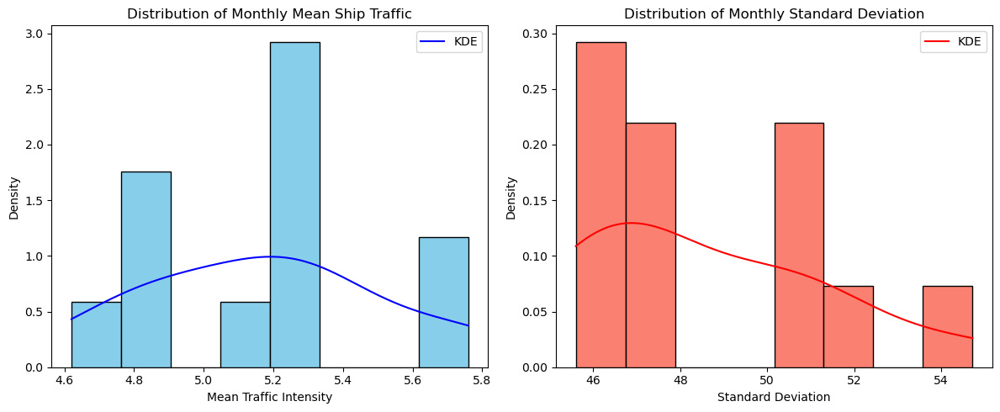

Figure 8: Histograms of distribution of monthly ship traffic.


In [30]:
# Plot a histogram for the mean and standard deviation

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Mean
data = ship_summary_df['Mean'].dropna()
counts, bins, _ = axs[0].hist(data, bins=8, color='skyblue', edgecolor='black', density=True)
x_vals = np.linspace(data.min(), data.max(), 200)
kde = gaussian_kde(data)
axs[0].plot(x_vals, kde(x_vals), color='blue', label='KDE')
axs[0].set_title('Distribution of Monthly Mean Ship Traffic')
axs[0].set_xlabel('Mean Traffic Intensity')
axs[0].set_ylabel('Density')
axs[0].legend()

# Standard deviation
data = ship_summary_df['Std Dev'].dropna()
counts, bins, _ = axs[1].hist(data, bins=8, color='salmon', edgecolor='black', density=True)
x_vals = np.linspace(data.min(), data.max(), 200)
kde = gaussian_kde(data)
axs[1].plot(x_vals, kde(x_vals), color='red', label='KDE')
axs[1].set_title('Distribution of Monthly Standard Deviation')
axs[1].set_xlabel('Standard Deviation')
axs[1].set_ylabel('Density')
axs[1].legend()

plt.tight_layout()
plt.show()
print('Figure 8: Histograms of distribution of monthly ship traffic.')

* Mean histogram:

The histogram shows a fairly normal distribution, suggesting that traffic is generally stable throughout the year and variations in the monthly mean are minor.

* Standard deviation histogram:

The histogram shows moderate spread with a positive skew. This tells us that most months had similar levels of spatial variability in ship traffic, but a few months exhibited higher variation. This suggests that while traffic is generally distributed in a consistent pattern, certain months had more concentrated shipping activity in specific areas.

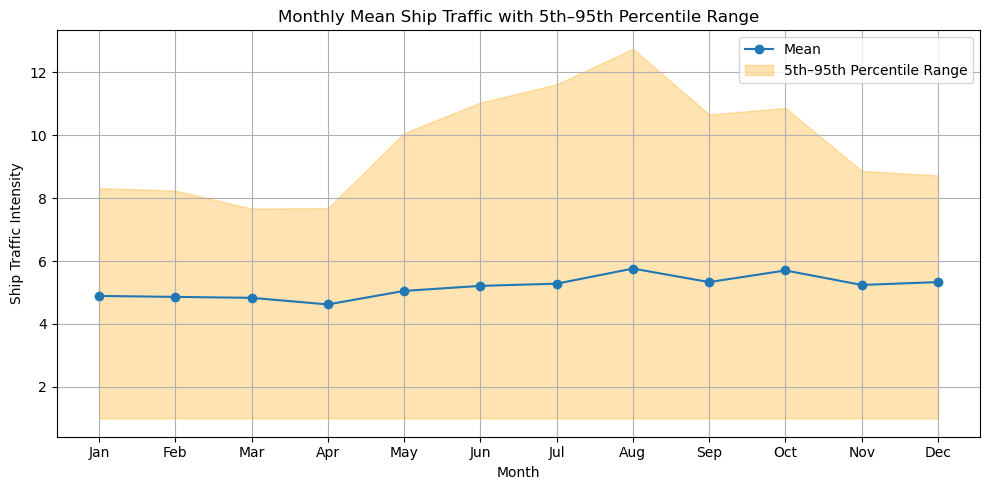

Figure 9: Line graph of monthly mean ship traffic with 5th-95th percentile range.


In [31]:
# Plot monthly mean ship traffic with 5th–95th percentile range

ship_summary_plot = ship_summary_df.copy()
ship_summary_plot['Month'] = ship_summary_plot.index

# Sort by calendar order
ship_summary_plot['Month'] = pd.Categorical(ship_summary_plot['Month'], categories=months, ordered=True)
ship_summary_plot = ship_summary_plot.sort_values('Month')

# Plot
plt.figure(figsize=(10, 5))
plt.plot(ship_summary_plot['Month'], ship_summary_plot['Mean'], marker='o', label='Mean')
plt.fill_between(ship_summary_plot['Month'],
                 ship_summary_plot['5th Percentile'],
                 ship_summary_plot['95th Percentile'],
                 color='orange', alpha=0.3, label='5th–95th Percentile Range')
plt.title("Monthly Mean Ship Traffic with 5th–95th Percentile Range")
plt.xlabel("Month")
plt.ylabel("Ship Traffic Intensity")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()
print('Figure 9: Line graph of monthly mean ship traffic with 5th-95th percentile range.')

Mean ship traffic stays relatively stable throughout the year, i.e. the same total amount of ship activity is spread out over roughly the same number of pixels each month.

However, the 95th percentile range varies a lot. This range represents the busiest ship traffic locations. A higher 95th percentile in a given month means that a few hotspots experienced much more traffic that month (e.g. August). A lower 95th percentile suggests that even the busiest areas were relatively moderate that month (e.g. April).

We can highlight this further using the Coefficient of Variation (CV).

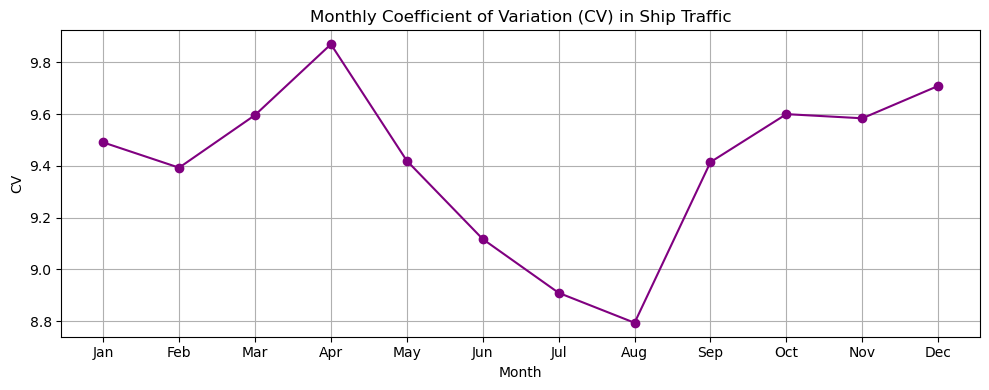

Figure 10: Line graph of monthly CV of ship traffic.


In [32]:
# Plot the monthly Coefficient of Variation (CV)
# This helps assess relative spatial variability in ship traffic across the year

ship_summary_df['CV'] = ship_summary_df['Std Dev'] / ship_summary_df['Mean']
ship_summary_df[['Mean', 'Std Dev', 'CV']]

plt.figure(figsize=(10, 4))
plt.plot(ship_summary_df.index, ship_summary_df['CV'], marker='o', color='purple')
plt.title("Monthly Coefficient of Variation (CV) in Ship Traffic")
plt.xlabel("Month")
plt.ylabel("CV")
plt.grid(True)
plt.tight_layout()
plt.show()
print('Figure 10: Line graph of monthly CV of ship traffic.')

CV = (Standard Deviation / Mean) × 100

The CV curve shows how ship traffic is distributed across the study area each month. A higher CV value means that traffic is concentrated in a few busy areas, while a lower value indicates a more even spread.

April has the highest CV and the most concentrated traffic, while August has the lowest CV and the most dispersed traffic. We can see these differences when we compare the maps of the two months.

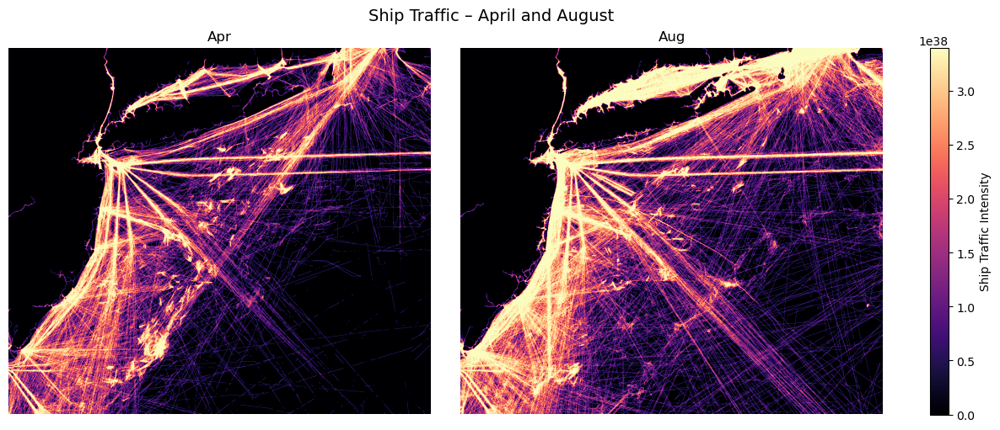

Figure 11: Raster maps of ship traffic in April & August.


In [33]:
# Visualise the CV difference by plotting the ship traffic maps for April and August

selected_months = ['Apr', 'Aug']
selected_indices = [months.index(m) for m in selected_months]
selected_rasters = [inverted_rasters[i] for i in selected_indices]

fig, axs = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

for i, month in enumerate(selected_months):
    im = axs[i].imshow(selected_rasters[i], cmap='magma', vmin=vmin, vmax=vmax)
    axs[i].set_title(month)
    axs[i].axis('off')

fig.colorbar(im, ax=axs, orientation='vertical', fraction=0.046, pad=0.04, label='Ship Traffic Intensity')
plt.suptitle("Ship Traffic – April and August", fontsize=14)
plt.show()
print('Figure 11: Raster maps of ship traffic in April & August.')

## Section 4: Spatial Analysis

We assess the risk of collision between whales and ships in four steps: (1) overlay the whale sightings with the ship traffic to visualise areas of spatial overlap, (2) conduct an initial raw risk calculation, (3) conduct a refined risk estimation using Kernel Density Estimation (KDE), and (4) calculate the Euclidian distance to shore and assess the risk in relation to the distance from shore.

### 4.1: Overlay of Whale Sightings and Traffic

We begin with basic information about sightings and ship traffic.

In [34]:
# Create table showing mean ship traffic and total whale sightings

# Use existing variables
monthly_whales = individuals_pivot.sum(axis=0)  # Total individuals per month
monthly_ship_means = ship_summary_df.loc[months, 'Mean']  # Match order

# Get bounding box of whale sightings
# We will clip the ship traffic to the sightings area
bounds = whales_gdf.total_bounds  # [xmin, ymin, xmax, ymax]
bbox_geom = box(*bounds)
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox_geom], crs='EPSG:32618')

mean_traffic_within_whale_area = {}

for month in months:
    path = f'output/{month}_proj.tif'

    with rasterio.open(path) as src:
        # Clip raster to bounding box
        out_image, out_transform = mask(src, bbox_gdf.geometry, crop=True)
        data = out_image[0]

        # Filter valid values
        valid = data[(data > 0) & (data < 1e10)]
        mean_val = np.mean(valid) if valid.size > 0 else np.nan

        mean_traffic_within_whale_area[month] = mean_val
mean_series = pd.Series(mean_traffic_within_whale_area)

# Whale individuals per month (already summed across species)
mean_sightings = individuals_pivot.sum(axis=0)

# Align with ship traffic series
mean_sightings = mean_sightings[mean_series.index]  # Ensure same month order

# Combine the series into a DataFrame
monthly_summary = pd.DataFrame({
    'Mean Ship Traffic': mean_series,
    'Total Whale Sightings': mean_sightings
})

# Display the table
monthly_summary = monthly_summary.round(2)
print('Table 6: Mean ship traffic and total whale sightings per month.')
monthly_summary

Table 6: Mean ship traffic and total whale sightings per month.


,Mean Ship Traffic,Total Whale Sightings
Jan,3.06,30
Feb,3.01,28
Mar,3.05,28
Apr,3.00,32
May,3.32,46
Jun,3.40,169
Jul,3.31,70
Aug,3.64,74
Sep,3.50,42
Oct,3.85,23


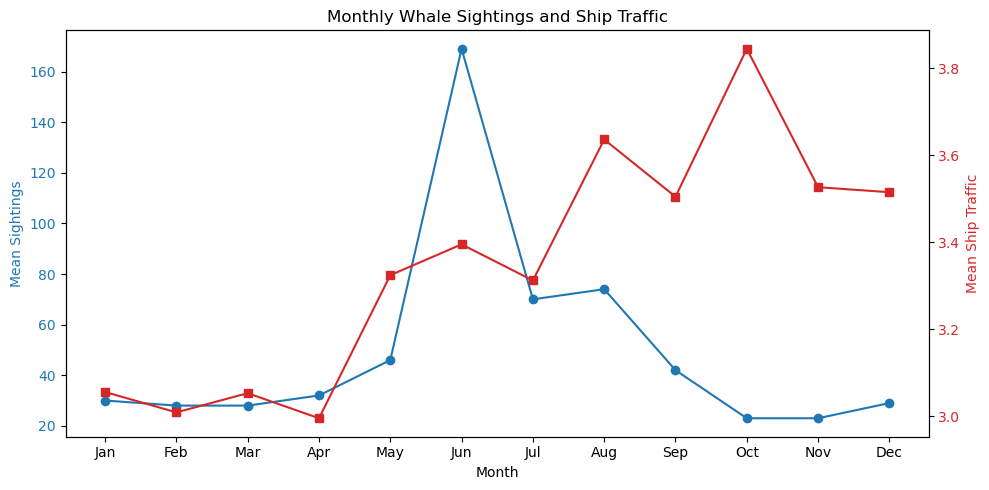

Figure 12: Line graph of monthly whale sightings and ship traffic.


In [35]:
# Plot both
fig, ax1 = plt.subplots(figsize=(10, 5))

# Whale sightings
ax1.set_xlabel('Month')
ax1.set_ylabel('Mean Sightings', color='tab:blue')
ax1.plot(mean_sightings.index, mean_sightings.values, marker='o', color='tab:blue', label='Sightings')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Ship traffic
ax2 = ax1.twinx()
ax2.set_ylabel('Mean Ship Traffic', color='tab:red')
ax2.plot(mean_series.index, mean_series.values, marker='s', color='tab:red', label='Ship Traffic')
ax2.tick_params(axis='y', labelcolor='tab:red')

plt.title('Monthly Whale Sightings and Ship Traffic')
fig.tight_layout()
plt.show()
print('Figure 12: Line graph of monthly whale sightings and ship traffic.')

Both ship traffic and whale sightings display signs of seasonality, but their peaks do not align. Ship traffic shows a modest increase from April through October, while whale sightings begin to rise in May and peak dramatically in June, then decreasing but remaining fairly high through August before declining. 

This mismatch is significant. During the peak whale months (June - August), ship traffic is slightly elevated, leading to a period of increased overlap. This overlap could represent an increased risk of vessel-whale collisions.

We can visualise these overlaps in simple maps. We take three months for comparison:
* February: Low sightings and low traffic
* June: High sightings and moderate traffic
* October: Low sightings and high traffic

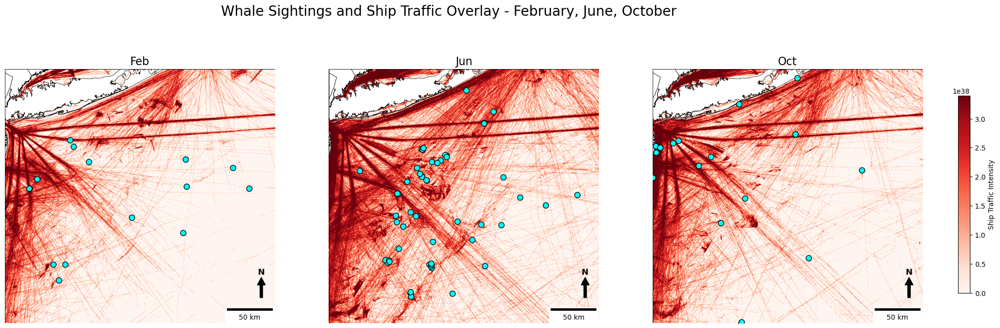

Figure 13: Overlay of whale sightings with raster maps of ship traffic in February, June, & October.


In [36]:
# Plot overlay maps for visual comparison

# Add month column to data represented as strings
whales_gdf['month_str'] = whales_gdf['month'].apply(lambda x: pd.to_datetime(f'2024-{x}-01').strftime('%b'))

# Clip all data to the same bounding box (derived from whale sightings)
whales_clipped = clip(whales_gdf, bbox_gdf)
studyarea_clipped = clip(studyarea, bbox_gdf)
shoreline_clipped = clip(shoreline, bbox_gdf)

selected_months = ['Feb', 'Jun', 'Oct']

fig, axes = plt.subplots(1, 3, figsize=(24, 8))
axes = axes.flatten()

for i, month in enumerate(selected_months):
    ax = axes[i]

    # Open and clip raster
    path = f'output/{month}_proj.tif'
    with rasterio.open(path) as src:
        if bbox_gdf.crs != src.crs:
            bbox_gdf = bbox_gdf.to_crs(src.crs)

        bbox_geom = [bbox_gdf.geometry.unary_union.__geo_interface__]
        arr_clipped, transform_clipped = mask(src, bbox_geom, crop=True)
        arr_clipped = arr_clipped[0]

        # Invert raster values
        inverted_arr = np.ma.masked_invalid(arr_clipped)
        inverted_arr = np.ma.max(inverted_arr) - inverted_arr

    # Plot raster
    extent = rasterio.plot.plotting_extent(arr_clipped, transform_clipped)
    raster_img = ax.imshow(inverted_arr, cmap='Reds', extent=extent, zorder=0)

    # Plot whales
    whales_month = whales_gdf[whales_gdf['month_str'] == month]
    whales_month.plot(ax=ax, markersize=65, color='aqua', edgecolor='black', linewidth=1, zorder=3, label='Whales')

    # Plot vectors
    studyarea_clipped.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5, zorder=1)
    shoreline_clipped.plot(ax=ax, facecolor='white', edgecolor='k', linewidth=0.5, zorder=1)
    bbox_gdf.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5, zorder=1)

    # North arrow
    arrow = mpatches.FancyArrow(0.95, 0.1, 0, 0.05, transform=ax.transAxes,
                                width=0.01, head_width=0.03, head_length=0.03,
                                color='black', zorder=3)
    ax.add_patch(arrow)
    ax.text(0.949, 0.20, 'N', transform=ax.transAxes,
            ha='center', va='center', fontsize=12, fontweight='bold', color='black')

    # Scalebar
    scalebar = sb.ScaleBar(dx=1, units="m", location='lower right')
    ax.add_artist(scalebar)

    # Title
    ax.set_title(f'{month}', fontsize=16)
    ax.axis('off')

# Shared colorbar
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.93, 0.25, 0.01, 0.5])
fig.colorbar(raster_img, cax=cbar_ax, label='Ship Traffic Intensity')

plt.suptitle('Whale Sightings and Ship Traffic Overlay - February, June, October', fontsize=20)
plt.show()
print('Figure 13: Overlay of whale sightings with raster maps of ship traffic in February, June, & October.')

### 4.2: Raw Risk Calculation

We calculate a simple, interpretable collision risk index based on the idea that risk increases when both whale presence and ship traffic are high at the same time. For each month, we multiply the mean ship traffic by the total number of whale sightings. This gives a basic risk score which is higher when both traffic and whales are present in high numbers. It is not a probability, but a relative index that reflects potential for collision.

This is adapted from Blondin et al. (2020). The risk of interaction calculated using the equation 
$Risk_i = D(Vessel)_i \times P(Whale)_i$

where
$D(vessel)$ is the density of the vessels (ship traffic) on grid cell $i$ 
$P(whale)$ is the whale probability of occurrence on grid cell $i$ .

We then normalise the risk, which scales the risk values so they range between 0 and 1, making it easier to compare months.

Finally, we compute what percentage of the total annual collision risk each month contributes, making easy to see which months account for the greatest share of total risk.

In [37]:
# Calculate a simple collision risk index: product of whale sightings and ship traffic

monthly_summary['Collision Risk Index'] = (
    monthly_summary['Mean Ship Traffic'] * monthly_summary['Total Whale Sightings']
)

# Normalise for comparison (0 to 1 scale)
normalised = (monthly_summary['Collision Risk Index'] - monthly_summary['Collision Risk Index'].min()) / \
             (monthly_summary['Collision Risk Index'].max() - monthly_summary['Collision Risk Index'].min())
monthly_summary['Normalised Risk (0–1)'] = normalised.round(2)

# Compute each month's percentage of the total risk
total_risk = monthly_summary['Collision Risk Index'].sum()
monthly_summary['Risk (%)'] = (monthly_summary['Collision Risk Index'] / total_risk * 100).round(2)

# Display summary
monthly_summary = monthly_summary.drop(columns=['Mean Ship Traffic', 'Total Whale Sightings'])
monthly_summary = monthly_summary.round(2)
print('Table 7: Raw collision risk calculation using relative collision risk index, normalised risk, and total weighting risk.')
monthly_summary

Table 7: Raw collision risk calculation using relative collision risk index, normalised risk, and total weighting risk.


,Collision Risk Index,Normalised Risk (0–1),Risk (%)
Jan,91.80,0.02,4.58
Feb,84.28,0.01,4.20
Mar,85.40,0.01,4.26
Apr,96.00,0.03,4.79
May,152.72,0.14,7.62
Jun,574.60,1.00,28.66
Jul,231.70,0.31,11.56
Aug,269.36,0.38,13.44
Sep,147.00,0.13,7.33
Oct,88.55,0.01,4.42


While this simple risk calculation gives a useful temporal overview, it lacks spatial resolution. It treats each month as a single unit and does not account for where whales and ships are co-occurring.

Generating monthly KDE maps of the whale sightings allows us to visualise whale presence as a continuous spatial surface, showing areas of high density such as migratory routes or feeding grounds. The KDE map enables spatial overlay with ship traffic rasters, allowing us to produce collision risk maps that reveal both when and where risk is most concentrated.

### 4.3: Kernel Density Estimation (KDE) Risk Calculation

To explore where and when whales are most at risk of being hit by ships, we use Kernel Density Estimation (KDE) to map their presence across the New York Bight. KDE is a spatial analysis technique that converts discrete scattered whale sightings into continuous smooth surfaces that show hotspots of whale activity. This creates a mre interpretable spatial distribution of presence than raw data and one which we can better combine with the ship traffic rasters.

We create one KDE map for each month to capture seasonal variation in whale distribution. We then multiply the KDE maps with the ship traffic rasters to create collision risk maps that show areas of high potential for collision, allowing us to estimate spatial collision risk. This spatial modeling approach provides a more comprehensive spatiotemporal view of risk than simply counting whales or tracking ships.

https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-analyst/how-kernel-density-works.htm

We generate monthly pixel-level collision risk maps by multiplying whale density (KDE) and log-transformed ship traffic.

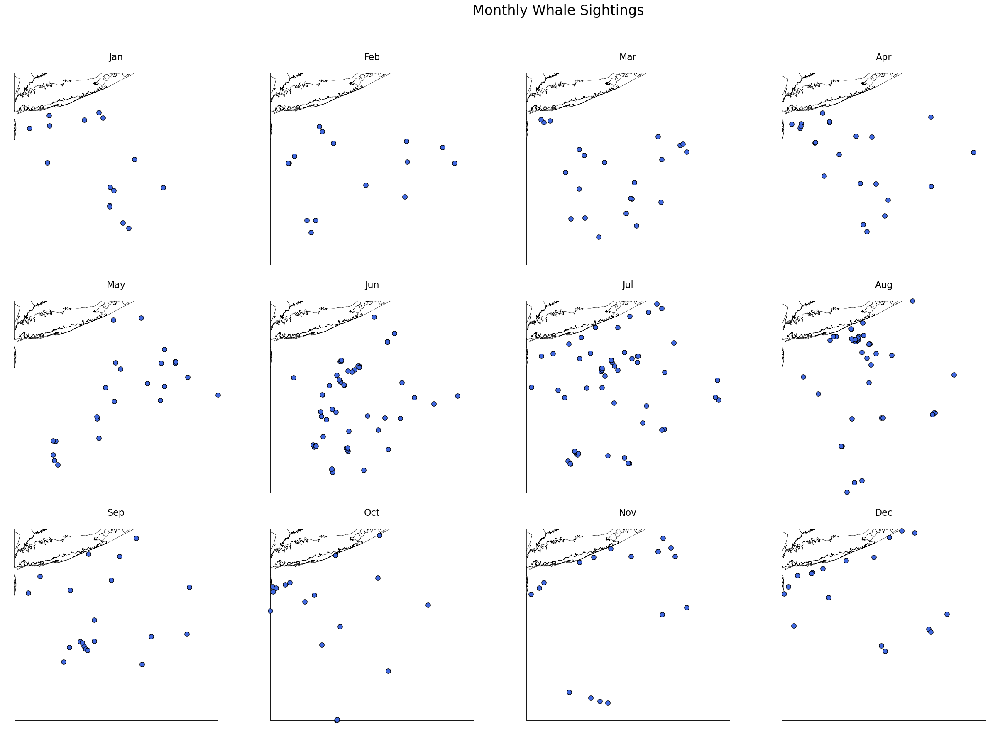

Figure 14: Maps of whale sightings per month in the study area.


In [38]:
# Visualise whale sightings per month for all months

fig, axes = plt.subplots(3, 4, figsize=(28, 18))
axes = axes.flatten()

for i, month in enumerate(months):
    ax = axes[i]

    # Filter whale sightings for the month
    whales_month = whales_gdf[whales_gdf['month_str'] == month]

    # Plot whale points
    whales_month.plot(ax=ax, markersize=65, color='royalblue', edgecolor='black', linewidth=1, zorder=3)

    # Plot vector overlays
    studyarea_clipped.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5, zorder=1)
    shoreline_clipped.plot(ax=ax, facecolor='white', edgecolor='black', linewidth=0.5, zorder=1)
    bbox_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5, zorder=1)

    # Title
    ax.set_title(month, fontsize=16)
    ax.axis('off')

# Final layout
plt.suptitle("Monthly Whale Sightings", fontsize=24)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()
print('Figure 14: Maps of whale sightings per month in the study area.')

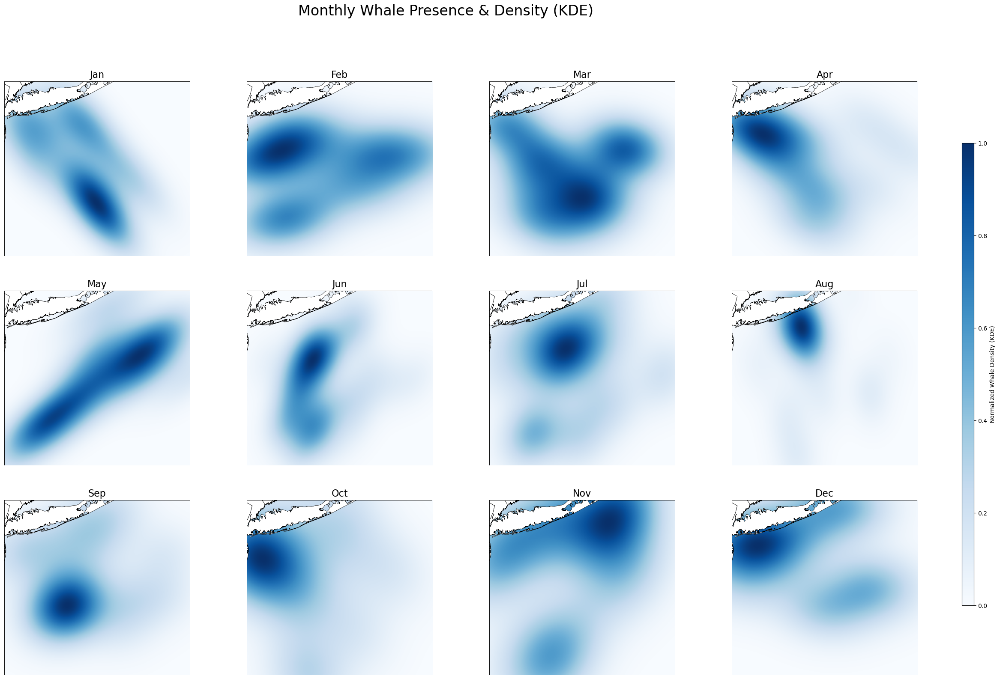

Figure 15: KDE maps of whale density per month in the study area.


In [39]:
# Create KDE maps of whale density using sightings for each month
# https://docs.scipy.org/doc/scipy/tutorial/stats/kernel_density_estimation.html

fig, axes = plt.subplots(3, 4, figsize=(28, 18))
axes = axes.flatten()

for i, month in enumerate(months):
    ax = axes[i]

    # Filter whale sightings for the month
    whales_month = whales_gdf[whales_gdf['month_str'] == month]

    # Get coordinates
    coords = np.vstack([whales_month.geometry.x, whales_month.geometry.y])
    kde = gaussian_kde(coords)

    # Open any ship raster just to get shape, transform, and bounds
    path = f'output/{month}_proj.tif'
    with rasterio.open(path) as src:
        if bbox_gdf.crs != src.crs:
            bbox_gdf = bbox_gdf.to_crs(src.crs)

        bbox_geom = [bbox_gdf.geometry.unary_union.__geo_interface__]
        arr, transform = mask(src, bbox_geom, crop=True)
        arr = arr[0]

    # KDE grid matching raster dimensions
    height, width = arr.shape
    xmin, ymin, xmax, ymax = bbox_gdf.total_bounds

    xs = np.linspace(xmin, xmax, width)
    ys = np.linspace(ymin, ymax, height)
    xg, yg = np.meshgrid(xs, ys[::-1])
    grid_coords = np.vstack([xg.ravel(), yg.ravel()])
    kde_vals = kde(grid_coords).reshape((height, width))

    # Normalise KDE for plotting
    kde_norm = (kde_vals - np.nanmin(kde_vals)) / (np.nanmax(kde_vals) - np.nanmin(kde_vals))

    # Plot KDE as background
    extent = rasterio.plot.plotting_extent(arr, transform)
    ax.imshow(kde_norm, cmap='Blues', extent=extent, zorder=0)

    # Overlay vectors
    studyarea_clipped.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5, zorder=1)
    shoreline_clipped.plot(ax=ax, facecolor='white', edgecolor='black', linewidth=0.5, zorder=1)
    bbox_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5, zorder=1)

    # Title
    ax.set_title(month, fontsize=16)
    ax.axis('off')

# Shared colorbar for KDE
fig.subplots_adjust(right=0.9, wspace=0.2, hspace=0.2)
cbar_ax = fig.add_axes([0.93, 0.2, 0.01, 0.6])
fig.colorbar(axes[0].images[0], cax=cbar_ax, label='Normalized Whale Density (KDE)')

plt.suptitle("Monthly Whale Presence & Density (KDE)", fontsize=24)
plt.show()
print('Figure 15: KDE maps of whale density per month in the study area.')

In [40]:
# Save the KDEs in a dictionary for later use

kde_dict = {}

for i, month in enumerate(months):
    whales_month = whales_gdf[whales_gdf['month_str'] == month]

    kde_vals = axes[i].images[0].get_array()
    kde_dict[month] = kde_vals

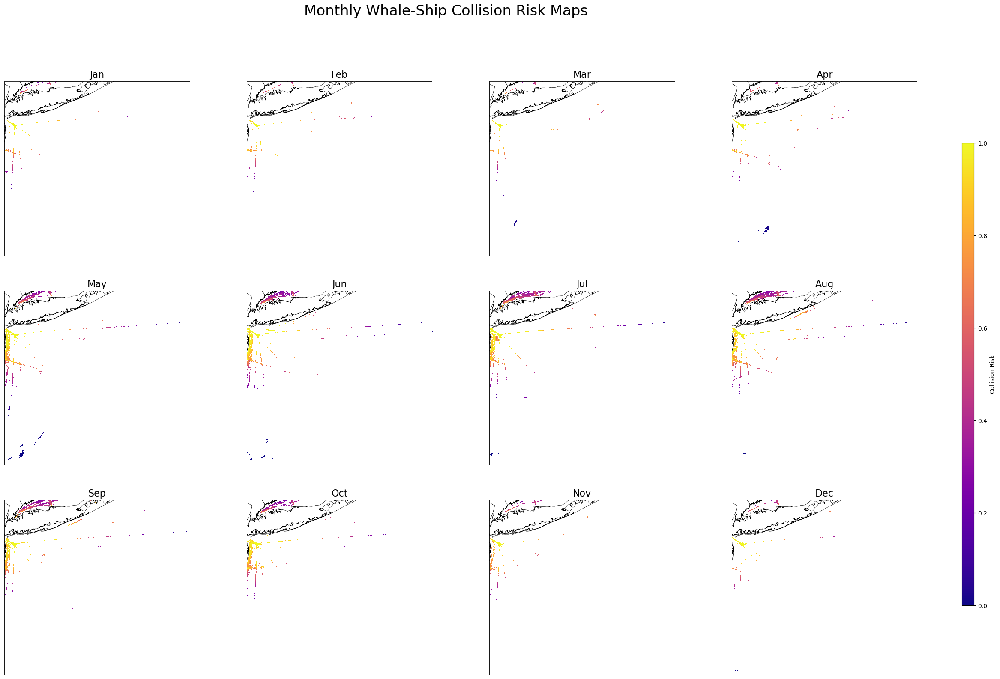

Figure 16: Maps of monthly whale-ship collision risk in the study area.


In [41]:
# Calculate the ship-whale collision risk map for each month using the whale KDE maps and the ship traffic rasters and plot

# Plot
fig, axes = plt.subplots(3, 4, figsize=(28, 18))
axes = axes.flatten()

for i, month in enumerate(months):
    ax = axes[i]

    path = f'output/{month}_proj.tif'
    with rasterio.open(path) as src:
        if bbox_gdf.crs != src.crs:
            bbox_gdf = bbox_gdf.to_crs(src.crs)

        bbox_geom = [bbox_gdf.geometry.unary_union.__geo_interface__]
        ship_arr, transform = mask(src, bbox_geom, crop=True)
        ship_band = ship_arr[0]
        if np.ma.isMaskedArray(ship_band):
            ship_band = ship_band.filled(np.nan)

    # Valid ship values only
    ship_valid = np.where((ship_band > 0) & (ship_band < 1e10), ship_band, np.nan)

    # Apply log scaling
    # https://numpy.org/devdocs/reference/generated/numpy.log1p.html
    ship_log = np.log1p(ship_valid)

    # Compute collision risk
    risk_map = kde_vals * ship_log

    # Clip & normalise risk map
    # https://numpy.org/doc/stable/reference/maskedarray.generic.html
    if np.ma.isMaskedArray(risk_map):
        risk_map = risk_map.filled(np.nan)

    p2, p98 = np.nanpercentile(risk_map, [2, 98])
    risk_clipped = np.clip(risk_map, p2, p98)
    risk_norm = (risk_clipped - p2) / (p98 - p2)

    # Percentile stretch: clip between 2nd and 98th percentiles
    lower = np.nanpercentile(risk_map, 2)
    upper = np.nanpercentile(risk_map, 98)
    risk_clipped = np.clip(risk_map, lower, upper)

    # Normalise for display
    risk_norm = (risk_clipped - lower) / (upper - lower)

    # Plot
    extent = rasterio.plot.plotting_extent(ship_band, transform)
    ax.imshow(risk_norm, cmap='plasma', extent=extent, zorder=0)

    # Vector overlays
    studyarea_clipped.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5, zorder=1)
    shoreline_clipped.plot(ax=ax, facecolor='white', edgecolor='black', linewidth=0.5, zorder=1)
    bbox_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5, zorder=1)

    # Title
    ax.set_title(month, fontsize=16)
    ax.axis('off')

# Shared colorbar
fig.subplots_adjust(right=0.9, wspace=0.2, hspace=0.2)
cbar_ax = fig.add_axes([0.93, 0.2, 0.01, 0.6])
fig.colorbar(axes[0].images[0], cax=cbar_ax, label='Collision Risk')

plt.suptitle("Monthly Whale-Ship Collision Risk Maps", fontsize=24)
plt.show()
print('Figure 16: Maps of monthly whale-ship collision risk in the study area.')

The collision risk maps show that risk is spatially concentrated in a few nearshore areas where whale presence and ship traffic overlap. The mostly white background confirms that most of the region poses low or no risk. These recurring hotspots likely represent persistent high-risk zones, ideal candidates for focused mitigation.

We can extract the summary statistics from those maps to quantify how risk varies spatially within each month, including average risk, hotspots, and how concentrated or spread out the risk is (via CV).

In [42]:
# Create a table of summary statistics for collision risk per month

risk_hist_data = {}

for month in months:
    kde_vals = kde_dict.get(month)

    # https://shapely.readthedocs.io/en/stable/reference/shapely.unary_union.html
    # https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.__geo_interface__.html
    with rasterio.open(f'output/{month}_proj.tif') as src:
        bbox_geom = [bbox_gdf.geometry.unary_union.__geo_interface__]
        ship_arr, _ = mask(src, bbox_geom, crop=True)
        ship_band = ship_arr[0]
        if np.ma.isMaskedArray(ship_band):
            ship_band = ship_band.filled(np.nan)

    # Apply log transformation to reduce skew (keeps only plausible positive values)
    ship_log = np.log1p(np.where((ship_band > 0) & (ship_band < 1e10), ship_band, np.nan))

    # Threshold KDE to avoid noise (removes very low densities)
    kde_thresh = np.where(kde_vals > 0.01 * np.nanmax(kde_vals), kde_vals, 0)

    risk_map = kde_thresh * ship_log
    risk_hist_data[month] = risk_map[np.isfinite(risk_map)]

summary_stats = {}

for month, data in risk_hist_data.items():

    summary_stats[month] = {
        'Mean': np.nanmean(data),
        'Median': np.nanmedian(data),
        'Std': np.nanstd(data),
        'Max': np.nanmax(data),
        '95th %ile': np.nanpercentile(data, 95)
    }

risk_summary_df = pd.DataFrame(summary_stats).T.round(4)
risk_summary_df['CV'] = (risk_summary_df['Std'] / risk_summary_df['Mean']).round(2)
print('Table 8: Summary statistics for collision risk per month.')
display(risk_summary_df)

Table 8: Summary statistics for collision risk per month.


,Mean,Median,Std,Max,95th %ile,CV
Jan,0.2598,0.2172,0.2720,2.5711,0.7674,1.05
Feb,0.4605,0.3899,0.3751,3.8449,1.2300,0.81
Mar,0.3388,0.2753,0.3041,3.3245,0.8856,0.90
Apr,0.3148,0.1696,0.3905,4.5162,1.0665,1.24
May,0.2449,0.1701,0.2651,2.5636,0.7466,1.08
Jun,0.2082,0.1182,0.2470,2.7182,0.6992,1.19
Jul,0.2989,0.2366,0.2450,2.4835,0.7547,0.82
Aug,0.1251,0.0462,0.2546,3.8288,0.5883,2.04
Sep,0.2764,0.2352,0.2192,3.2698,0.6738,0.79
Oct,0.4833,0.2964,0.5244,5.5032,1.6353,1.09


October to December represent the most consistently high-risk periods, with both widespread and intense localised risk. Meanwhile, months like August show extremely uneven spatial distribution, with a few dangerous hotspots amidst largely low-risk areas.

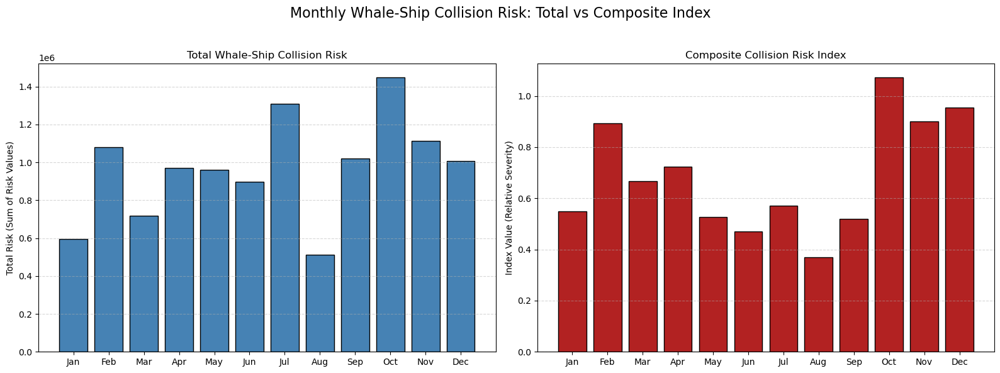

Figure 17: Histograms of monthly whale-ship collision risk.


In [43]:
# Plot histogram of collision risk

# Calculate
total_risk = pd.Series({
    month: risk_summary_df.loc[month, 'Mean'] * len(risk_hist_data[month])
    for month in months
})
risk_summary_df['Index'] = (
    risk_summary_df['Mean'] +
    0.5 * risk_summary_df['Std'] +
    0.2 * risk_summary_df['95th %ile']
)
index_values = risk_summary_df.loc[months, 'Index']

# Plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=False)

x = np.arange(len(months))

# Total Risk Plot
axes[0].bar(x, total_risk, color='steelblue', edgecolor='black')
axes[0].set_title('Total Whale-Ship Collision Risk')
axes[0].set_ylabel('Total Risk (Sum of Risk Values)')
axes[0].set_xticks(x)
axes[0].set_xticklabels(months, rotation=0)
axes[0].grid(axis='y', linestyle='--', alpha=0.5)

# Risk Index Plot
axes[1].bar(x, index_values, color='firebrick', edgecolor='black')
axes[1].set_title('Composite Collision Risk Index')
axes[1].set_ylabel('Index Value (Relative Severity)')
axes[1].set_xticks(x)
axes[1].set_xticklabels(months, rotation=0)
axes[1].grid(axis='y', linestyle='--', alpha=0.5)

plt.suptitle('Monthly Whale-Ship Collision Risk: Total vs Composite Index', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()
print('Figure 17: Histograms of monthly whale-ship collision risk.')

The total whale-ship collision risk shows how much risk there is overall, while the composite collision risk index shows how bad or uneven it is. Together, they help distinguish between months with widespread moderate risk vs. those with fewer but more intense hotspots. 

### 4.4: Euclidian Distance to Shore

Using the study area polygon, a 'distance to shore' analysis will be conducted. To do that, the polygon layer will be converted to a raster layer first, in which the raster layer will show the value of distance in meters to the nearest landmass at any point.

This will use Euclidean distance analysis. Euclidean distance analysis describes a point or a cell’s straight-line distance analysis to a source. In this case, the source will be defined as the landmass. Each cell (ocean) will calculate the nearest distance to source, which is the landmass.

https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-analyst/understanding-euclidean-distance-analysis.htm

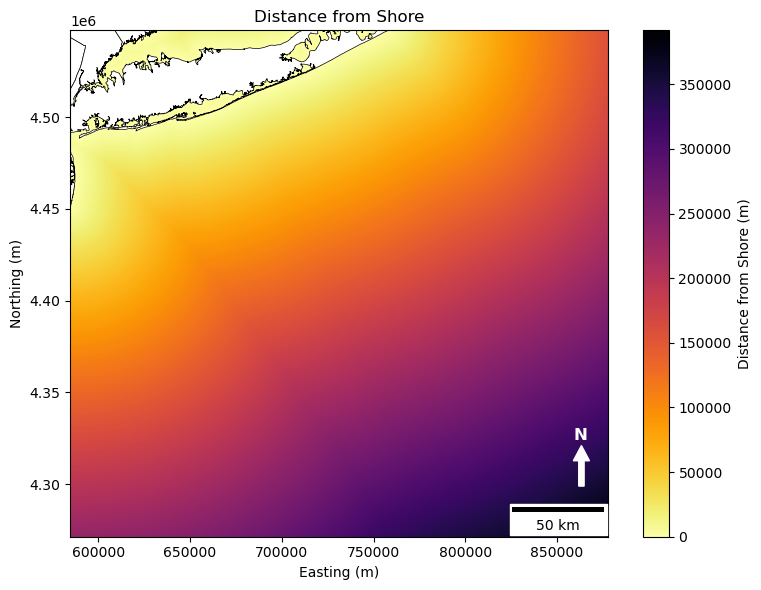

Figure 18: Map of Euclidian distance from shore.


In [44]:
# Create a raster of euclidian distance to shore and display

pixel_size = 100

# Rasterise land as 0, ocean as 1
ocean_raster = rasterize(
    [(geom, 0) for geom in shoreline_clipped.geometry],
    out_shape=(height, width),
    transform=transform,
    fill=1,
    dtype='uint8'
)

# We calculate the euclidean distance to shore to calculate distance at any point to the nearest landmass
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.distance_transform_edt.html
distance = distance_transform_edt(ocean_raster) * pixel_size

# Get bounds from the raster transform
x_min, y_max = xy(transform, 0, 0)
x_max, y_min = xy(transform, distance.shape[0] - 1, distance.shape[1] - 1)

extent = [x_min, x_max, y_min, y_max]

# Plot
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(distance, cmap='inferno_r', origin='upper', extent=extent, zorder=0)
shoreline_clipped.plot(ax=ax, facecolor='white', edgecolor='black', linewidth=0.5, zorder=1)
fig.colorbar(im, ax=ax, label='Distance from Shore (m)')

# North arrow
arrow = mpatches.FancyArrow(0.95, 0.1, 0, 0.05, transform=ax.transAxes,
                            width=0.01, head_width=0.03, head_length=0.03,
                            color='white', zorder=3)
ax.add_patch(arrow)
ax.text(0.949, 0.20, 'N', transform=ax.transAxes,
        ha='center', va='center', fontsize=12, fontweight='bold', color='white')

# Scalebar
scalebar = sb.ScaleBar(dx=1, units="m", location='lower right')
ax.add_artist(scalebar)

ax.set_title('Distance from Shore')
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')
plt.tight_layout()
plt.show()
print('Figure 18: Map of Euclidian distance from shore.')

In [45]:
# Calculate risk based on distance from shore

# Normalise risk map (so that results range from 0 - 1)
risk_min = np.nanmin(risk_map)
risk_max = np.nanmax(risk_map)
risk_norm = (risk_map - risk_min) / (risk_max - risk_min)

# Flatten arrays and clean
risk_flat = risk_norm.flatten()
distance_flat = distance.flatten()

valid = ~np.isnan(risk_flat) & ~np.isnan(distance_flat)
risk_clean = risk_flat[valid]
distance_clean = distance_flat[valid]

# Bin distances (every 10 km)
bins = np.arange(0, np.nanmax(distance_clean), 10000)
bin_indices = np.digitize(distance_clean, bins)

# Aggregate stats per bin
results = []
for i in range(1, len(bins)):
    in_bin = risk_clean[bin_indices == i]
    if len(in_bin) > 0:
        results.append({
            'Distance Band (km)': f'{bins[i-1]/1000:.0f}-{bins[i]/1000:.0f}',
            'Mean Risk': np.mean(in_bin),
            'Median Risk': np.median(in_bin),
            'Max Risk': np.max(in_bin),
            'Pixels': len(in_bin)
        })

# Convert to DataFrame and display
distance_risk_df = pd.DataFrame(results)
distance_risk_df = distance_risk_df.round(3)
print('Table 9: Collision risk based on distance from shore (10km).')
distance_risk_df

Table 9: Collision risk based on distance from shore (10km).


,Distance Band (km),Mean Risk,Median Risk,Max Risk,Pixels
0,0-10,0.155,0.124,1.000,265332
1,10-20,0.167,0.126,0.877,186163
2,20-30,0.166,0.128,0.793,133786
3,30-40,0.133,0.113,0.886,132271
4,40-50,0.112,0.096,0.455,133673
5,50-60,0.099,0.087,0.412,143593
6,60-70,0.084,0.072,0.378,135796
7,70-80,0.071,0.059,0.277,123831
8,80-90,0.055,0.048,0.220,110489
9,90-100,0.043,0.039,0.182,106071


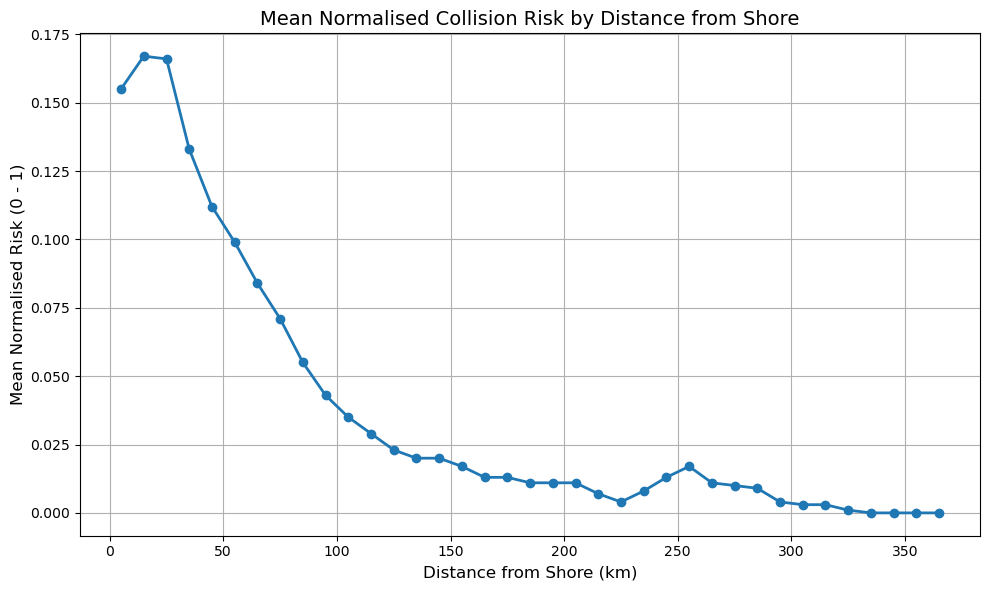

Figure 19: Line graph of mean normalised collision risk by distance from shore.


In [46]:
# Display table information as line graph

# Extract midpoint of each distance band for plotting
distance_midpoints = [
    (int(band.split('-')[0]) + int(band.split('-')[1])) / 2
    for band in distance_risk_df['Distance Band (km)']
]

# Plot
plt.figure(figsize=(10, 6))
plt.plot(distance_midpoints, distance_risk_df['Mean Risk'], marker='o', linewidth=2)

plt.title('Mean Normalised Collision Risk by Distance from Shore', fontsize=14)
plt.xlabel('Distance from Shore (km)', fontsize=12)
plt.ylabel('Mean Normalised Risk (0 - 1)', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()
print('Figure 19: Line graph of mean normalised collision risk by distance from shore.')

### 4.5 Interpretation

Raw whale sightings peak dramatically in June, making it the highest month for the raw collision risk index (accounting for nearly 29% of the total annual risk). However, the mean KDE collision risk for June is relatively low (0.2082), with a high coefficient of variation (1.19). We can see why this is the case in the map in 4.1.1; most whale sightings occured outside of areas with the highest amount of traffic, leading to low overall spatial risk.

In contrast, months like October, November, and December show much higher KDE-based mean risk values (around 0.45–0.49) and relatively lower CVs, indicating a more consistent spatial overlap between whales and ships. Interestingly, these months show low total sightings and low raw risk, yet high spatial collision potential, reinforcing that where whales are matters more than how many.

August is another key month: while raw risk is relatively high (269.36), KDE-based risk is low and extremely uneven (20.3), implying a few intense hotspots amidst large low-risk areas. This reflects a highly concentrated risk pattern, possibly nearshore or port-adjacent.

The comparison between raw and KDE-based risk reveals that abundance alone is not a reliable indicator of collision risk. Spatial co-occurrence is the defining factor. Months like June show high whale presence but low spatial risk due to limited overlap with shipping, while Oct to Dec show fewer whales but higher and more widespread risk.

## Discussion & Conclusion

### Limitations

There are a few limitations to this study. 

First is only using one year (2018) for ship intensity data. While the assumption is that ship traffic seasonality is stable through the years, certain events and years may affect changes in these patterns. For example, in 2020, shipping traffic reduced drastically due to the COVID-19 pandemic (March et al., 2021), however the whale sighting dataset’s last data collection date was just before the COVID-19 pandemic lockdowns.

Furthermore, the ship traffic intensity data only accounts for vessel density along tracklines. This data does not account for the speed at which the ships travel. Ships travelling at 10 knots and higher have a 0.31 - 0.57 probability of a lethal strike when they collide with whales (Redfern et al., 2020; Vanderlaan & Taggart, 2007; Conn & Silber, 2013). A future study on ship collision risk should account for vessel speed in the risk calculation

Another limitation is relying on whale transect point data and only using Kernel Density Estimation. This dataset will therefore be subjected to boundary effects, and it may appear that whales are significantly less likely to appear beyond the transect, while this is not true. We were only able to use Kernel Density Estimation to interpolate whale presence probability throughout the study area, however species distribution modelling (SDM) using its habitat niches would be more appropriate and accurate. Species distribution modelling uses a fitted model to relate the occurrence of a species (presence-absence) to its environmental variables, often using maximum entropy (MaxEnt) or a generalised linear model (Melo-Marino et al., 2020).

To do SDM, the research project would require far more species presence/absence data and environmental data such as bathymetry data, sea surface temperature, oceanic currents, surface chlorophyll-a concentration, etc., and therefore would require an expansion of the scope of the project (Frasier et al., 2021). 


### Discussion & Recommendations

This project relates to SDG 14 (Life Below Water). 

Based on whale migration patterns, there is a tendency for whales to pass through the US North-East close to shore during the winter during migration (Johnson et al., 2022). This is supported by the KDE (Fig. 15) where the whales show hotspots close to shore. Interestingly, closer to the summer, whales seem to only be passing by the region and not going near the coast but they are far more abundant (Fig. 15; Fig. 7). Currently, researchers do not know the reason for why whales visit the New York Harbour or have an explanation for why the whales seem to show this pattern (Brown et al., 2022). Their study also found whales appearing in abundance in the summer in the study area while this contrasts their previous findings of whales being present closer to the coast in the winter. Brown et al. (2022) attributed this to the presence of schools of Menhaden. Menhaden spawn in estuaries (such as Long Island Sound) in the winter, and go further out the coast during the summer (NOAA Fisheries, 2025).

As mean normalised collision risk tends to decrease further from shore (Fig. 19), this puts the whales at risk when they are passing through in the winter and are closer to shore, rather than when they are feeding further out in the open ocean during the summer. In general, the whales do have higher collision risk in areas near shipping lanes (Fig. 16). 

Given economic and trade interests, it is not realistic to halt or drastically reduce shipping. 
However, there needs to be management regulations and policies for vessel traffic in place by the US Government (as well as the New York and New Jersey port authorities). To mitigate risk of ship collision with whales, channels separating whales and ship traffic need to be designed. An effective traffic separation scheme could be effective, as well as seasonal slowdowns where vessels are required to travel at under 10 knots in areas where whales are most abundant at that time (Johnson et al., 2022). Based on this analysis, this would mean slowdowns in the summer further out from shore and slowdowns close to shore in the winter. The US Coast Guard needs to strictly monitor and enforce these regulations, as in the past slowdown regulations have been found to have low compliance (Oceana, 2021).

## References

Blondin, H., Abrahms, B., Crowder, L. B., & Hazen, E. L. (2020). Combining high temporal resolution whale distribution and vessel tracking data improves estimates of ship strike risk. Biological Conservation, 250, 108757. https://doi.org/10.1016/j.biocon.2020.108757

Brown, D. M., Robbins, J., Sieswerda, P. L., Ackerman, C., Aschettino, J. M., Barco, S., Boye, T., DiGiovanni, R. A., Durham, K., Engelhaupt, A., Hill, A., Howes, L., Johnson, K. F., Jones, L., King, C. D., Kopelman, A. H., Laurino, M., Lonergan, S., Mallette, S. D., … Wiedenmann, J. (2022). Site fidelity, population identity and demographic characteristics of humpback whales in the New York Bight apex. Journal of the Marine Biological Association of the United Kingdom, 102(1–2), 157–165. https://doi.org/10.1017/S0025315422000388

Brown, D. M., Sieswerda, P. L., & Parsons, E. C. M. (2019). Potential encounters between humpback whales (Megaptera novaeangliae) and vessels in the New York Bight apex, USA. Marine Policy, 106, 103527. https://doi.org/10.1016/j.marpol.2019.103527

C.S. Baker & L. M. Herman. (1989). Baker, C.S. &amp; Herman, L. M. (1989). Behavioral responses of summering humpback whales to vessel traffic: Experimental and opportunistic observations. Technical Report NPS-NR-TRS-89-01. Final Report to the National Park Service, Alaska Regional Office. United States Department of the Interior. US Department of the Interior, The National Park Service. https://doi.org/10.13140/RG.2.1.1433.4327

Esa. (2013). ERRATUM. Ecosphere, 4(10), 1–1. https://doi.org/10.1890/2150-8925-4.10.art126

Frasier, K. E., Garrison, L. P., Soldevilla, M. S., Wiggins, S. M., & Hildebrand, J. A. (2021). Cetacean distribution models based on visual and passive acoustic data. Scientific Reports, 11(1), 8240. https://doi.org/10.1038/s41598-021-87577-1

IUCN. (2008). Physeter macrocephalus: Taylor, B.L., Baird, R., Barlow, J., Dawson, S.M., Ford, J., Mead, J.G., Notarbartolo di Sciara, G., Wade, P. & Pitman, R.L.: The IUCN Red List of Threatened Species 2019: e.T41755A160983555 [Dataset]. https://doi.org/10.2305/IUCN.UK.2008.RLTS.T41755A160983555.en

IUCN. (2018a). Balaenoptera borealis: Cooke, J.G.: The IUCN Red List of Threatened Species 2018: e.T2475A130482064 [Dataset]. https://doi.org/10.2305/IUCN.UK.2018-2.RLTS.T2475A130482064.en

IUCN. (2018b). Balaenoptera musculus: Cooke, J.G.: The IUCN Red List of Threatened Species 2018: e.T2477A156923585 [Dataset]. https://doi.org/10.2305/IUCN.UK.2018-2.RLTS.T2477A156923585.en

IUCN. (2018c). Balaenoptera physalus: Cooke, J.G.: The IUCN Red List of Threatened Species 2018: e.T2478A50349982 [Dataset]. https://doi.org/10.2305/IUCN.UK.2018-2.RLTS.T2478A50349982.en

IUCN. (2018d). Megaptera novaeangliae: Cooke, J.G.: The IUCN Red List of Threatened Species 2018: e.T13006A50362794 [Dataset]. https://doi.org/10.2305/IUCN.UK.2018-2.RLTS.T13006A50362794.en

IUCN. (2020). Eubalaena glacialis: Cooke, J.G.: The IUCN Red List of Threatened Species 2020: e.T41712A178589687 [Dataset]. https://doi.org/10.2305/IUCN.UK.2020-2.RLTS.T41712A178589687.en

Johnson, C., Reisinger, R., Palacios, D., Friedlaender, A., Zerbini, A., Willson, A., Lancaster, M. , Battle, J., Graham, A., Cosandey-Godin, A., Jacob T., Felix, F., Grilly, E., Shahid, U., Houtman, N., Alberini, A., Montecinos, Y., Najera, E. and Kelez, S. (2022). Protecting Blue Corridors, Challenges and Solutions for Migratory Whales Navigating International and National Seas. WWF, Oregon State University, University of California, Santa Cruz, Publisher: WWF International, Switzerland.

Johnston, S. T., & Painter, K. J. (2024). Avoidance, confusion or solitude? Modelling how noise pollution affects whale migration. Movement Ecology, 12(1), 17. https://doi.org/10.1186/s40462-024-00458-w

King, C. D., Chou, E., Rekdahl, M. L., Trabue, S. G., & Rosenbaum, H. C. (2021). Baleen whale distribution, behaviour and overlap with anthropogenic activity in coastal regions of the New York Bight. Marine Biology Research, 17(4), 380–400. https://doi.org/10.1080/17451000.2021.1967993

March, D., Metcalfe, K., Tintoré, J., & Godley, B. J. (2021). Tracking the global reduction of marine traffic during the COVID-19 pandemic. Nature Communications, 12(1), 2415. https://doi.org/10.1038/s41467-021-22423-6

New York State Department of Environmental Conservation. (2024, March 29). Marine Mammals Of New York. https://dec.ny.gov/nature/animals-fish-plants/marine-mammals

Oceana. Oceana Report: Speeding Toward Extinction: Vessel Strikes Threaten North Atlantic Right Whales. Oceana (2021). at <https://usa. oceana.org/reports/speeding-toward-extinction-vessel-strikes-threatennorth- atlantic-right-whales/>

Pirotta, V., Grech, A., Jonsen, I. D., Laurance, W. F., & Harcourt, R. G. (2019). Consequences of global shipping traffic for marine giants. Frontiers in Ecology and the Environment, 17(1), 39–47. https://doi.org/10.1002/fee.1987

Redfern, J. V., Hodge, B. C., Pendleton, D. E., Knowlton, A. R., Adams, J., Patterson, E. M., Good, C. P., & Roberts, J. J. (2024). Estimating reductions in the risk of vessels striking whales achieved by management strategies. Biological Conservation, 290, 110427. https://doi.org/10.1016/j.biocon.2023.110427

Rodrigue, J.-P. (2003). The Port Authority of New York and New Jersey: Global Changes, Regional Gains and Local Challenges in Port Development. Les Cahiers Scientifiques Du Transport - Scientific Papers in Transportation, 44 | 2003, 12014. https://doi.org/10.46298/cst.12014

Smith, S. E., Brown, D. M., Oliveras, J. R., Sieswerda, P. L., Ahearn, S., & Reiss, D. (2022). A Preliminary Study on Humpback Whales Lunge Feeding in the New York Bight, United States. Frontiers in Marine Science, 9, 798250. https://doi.org/10.3389/fmars.2022.798250

Vanderlaan, A. S. M., & Taggart, C. T. (2007). VESSEL COLLISIONS WITH WHALES: THE PROBABILITY OF LETHAL INJURY BASED ON VESSEL SPEED. Marine Mammal Science, 23(1), 144–156. https://doi.org/10.1111/j.1748-7692.2006.00098.x

Zoidis, A. M., Lomac-MacNair, K. S., Ireland, D. S., Rickard, M. E., McKown, K. A., & Schlesinger, M. D. (2021). Distribution and density of six large whale species in the New York Bight from monthly aerial surveys 2017 to 2020. Continental Shelf Research, 230, 104572. https://doi.org/10.1016/j.csr.2021.104572

### Contributions

This project was completed as part of a university group assignment and is shared here with full approval from my collaborator.

- **Coding, spatial data processing and analysis, results and interpretation of results:** Hamdan Alkhezam  
- **Research, data sourcing/gathering, discussion, and real-world contextualisation of findings:** Christina Netta